 # Crime Analytics Dashboard for Washington, D.C

## Load Data

In [1]:
import sys
import os

# Get the absolute path to the scripts folder
script_path = os.path.abspath("../scripts")
sys.path.append(script_path)

In [2]:
import warnings

warnings.filterwarnings("ignore")

In [3]:
import automate_import # type: ignore

All packages are installed and imported successfully!


In [4]:
# Now import all packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import folium
from folium.plugins import HeatMap
import geopandas as gpd
import openpyxl

In [5]:
# set default style for plots to dark gray color
import matplotlib.pyplot as plt
import seaborn as sns

# # Set global style for all plots
# # plt.rcParams["axes.facecolor"] = "lightgray"  # Light gray background
# plt.rcParams["grid.color"] = "white"  # White grid lines
# # plt.rcParams["axes.edgecolor"] = "black"  # Black border
# plt.rcParams["xtick.color"] = "black"  # Black tick labels
# plt.rcParams["ytick.color"] = "black"
# plt.rcParams["axes.labelcolor"] = "black"  # Axis label color
# plt.rcParams["text.color"] = "black"  # Text color
# plt.rcParams["axes.titleweight"] = "bold"  # Bold title

# Set seaborn style
# sns.set_style("darkgrid")
sns.set_palette(["#808080"])  # Light gray bars
# Other options: "whitegrid", "dark", "white", "ticks"

In [6]:
# Load Excel file
file_path = "../data/raw/crime_data.xlsx"  # Update with your actual file path
df = pd.read_excel(file_path, engine="openpyxl")

# Display the first 5 rows
print(df.head())

  ANC   LATITUDE                                  BLOCK offensegroup  \
0  6E  38.903732         100 - 199 block of l street ne     property   
1  2C  38.903743         18th street nw and l street nw     property   
2  1B  38.917236     2000 - 2099 block of 8th street nw     property   
3  5D  38.909405     1300 - 1399 block of 5th street ne     property   
4  1D  38.930801  1600 - 1665 block of lamont street nw     property   

                       location sector         YBLOCK  METHOD       CCN  \
0  38.9037316022,-77.0047283051    5D1  137319.550000  others  25002077   
1  38.9037432394,-77.0416730027    2D3  137321.656253  others  25008226   
2   38.917236462,-77.0229457261    3D2  138818.940000  others  25013256   
3  38.9094049494,-76.9975459006    5D1  137949.330000  others  25001526   
4  38.9308014266,-77.0373827045    3D1  140325.180000  others  25002498   

                 END_DATE  ...  DISTRICT         XBLOCK  YEAR  \
0                     NaN  ...       5.0  399589.87

In [7]:
df.columns = df.columns.str.upper()

In [8]:
df.info(
)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3867 entries, 0 to 3866
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ANC                   3866 non-null   object 
 1   LATITUDE              3867 non-null   float64
 2   BLOCK                 3867 non-null   object 
 3   OFFENSEGROUP          3867 non-null   object 
 4   LOCATION              3867 non-null   object 
 5   SECTOR                3859 non-null   object 
 6   YBLOCK                3867 non-null   float64
 7   METHOD                3867 non-null   object 
 8   CCN                   3867 non-null   int64  
 9   END_DATE              3583 non-null   object 
 10  LONGITUDE             3867 non-null   float64
 11  OFFENSE-TEXT          3867 non-null   object 
 12  NEIGHBORHOOD_CLUSTER  3866 non-null   object 
 13  SHIFT                 3867 non-null   object 
 14  PSA                   3859 non-null   float64
 15  CENSUS_TRACT         

## Clean Data

In [10]:
df.rename({'REPORT_DAT':'REPORT_DATE'}, axis=1, inplace=True)

In [11]:
# Convert columns to datetime
date_cols = ["START_DATE", "END_DATE", "REPORT_DATE"]
for col in date_cols:
    df[col] = pd.to_datetime(df[col], errors="coerce")

# Verify conversion
print(df[date_cols].dtypes)

START_DATE     datetime64[ns]
END_DATE       datetime64[ns]
REPORT_DATE    datetime64[ns]
dtype: object


In [12]:
df.drop(columns=["OCTO_RECORD_ID"], axis=1, inplace=True)

In [13]:
# Fill missing categorical values with mode (most frequent)
for col in ["WARD", "PSA", "DISTRICT", "CENSUS_TRACT"]:
    df[col].fillna(df[col].mode()[0], inplace=True)

# Drop rows where START_DATE is missing (essential for analysis)
df.dropna(subset=["START_DATE"], inplace=True)

In [14]:
df.columns

Index(['ANC', 'LATITUDE', 'BLOCK', 'OFFENSEGROUP', 'LOCATION', 'SECTOR',
       'YBLOCK', 'METHOD', 'CCN', 'END_DATE', 'LONGITUDE', 'OFFENSE-TEXT',
       'NEIGHBORHOOD_CLUSTER', 'SHIFT', 'PSA', 'CENSUS_TRACT', 'WARD', 'BID',
       'DISTRICT', 'XBLOCK', 'YEAR', 'REPORT_DATE', 'UCR-RANK', 'OFFENSEKEY',
       'START_DATE', 'VOTING_PRECINCT', 'OFFENSE', 'BLOCK_GROUP'],
      dtype='object')

In [15]:
categorical_cols = [
    "WARD",
    "PSA",
    "DISTRICT",
    "NEIGHBORHOOD_CLUSTER",
    "VOTING_PRECINCT",
    "BLOCK_GROUP",
    "CENSUS_TRACT",
]
df[categorical_cols] = df[categorical_cols].astype(str)  # Convert to string

In [16]:
print(df[["END_DATE", "REPORT_DATE"]].dtypes)

END_DATE       datetime64[ns]
REPORT_DATE    datetime64[ns]
dtype: object


In [17]:
# Check for Negative Durations (END_DATE before START_DATE)
df["Duration_Issue"] = df.apply(
    lambda row: (
        row["END_DATE"] < row["START_DATE"] if pd.notna(row["END_DATE"]) else False
    ),
    axis=1,
)

# Check for Reporting Delays (Days between START_DATE and REPORT_DATE)
df["Report_Delay_Days"] = (df["REPORT_DATE"] - df["START_DATE"]).dt.days

# Check for Resolution Before Reporting (END_DATE before REPORT_DATE)
df["Resolution_Before_Report"] = df.apply(
    lambda row: (
        row["END_DATE"] > row["REPORT_DATE"]
        if pd.notna(row["END_DATE"]) and pd.notna(row["REPORT_DATE"])
        else False
    ),
    axis=1,
)

# Flag rows with missing START_DATE or END_DATE
df["Missing_Start_Date"] = df["START_DATE"].isna()
df["Missing_End_Date"] = df["END_DATE"].isna()

# Display flagged rows
issues_df = df[
    (df["Duration_Issue"])
    | (df["Resolution_Before_Report"])
    | (df["Missing_Start_Date"])
    | (df["Missing_End_Date"])
]
print(f"Total Issues Found: {len(issues_df)}")
print(
    issues_df[
        [
            "START_DATE",
            "END_DATE",
            "REPORT_DATE",
            "Duration_Issue",
            "Resolution_Before_Report",
            "Report_Delay_Days",
            "Missing_Start_Date",
            "Missing_End_Date",
        ]
    ].head(10)
)

Total Issues Found: 485
            START_DATE            END_DATE         REPORT_DATE  \
0  2025-01-04 21:24:00                 NaT 2025-01-04 22:13:33   
1  2025-01-18 03:15:00                 NaT 2025-01-18 04:03:46   
12 2025-02-03 18:20:00                 NaT 2025-02-03 18:51:04   
14 2025-02-13 05:25:00 2025-02-14 16:26:00 2025-02-14 16:25:39   
16 2025-01-14 08:56:00                 NaT 2025-01-14 11:37:40   
18 2025-01-31 00:00:00                 NaT 2025-01-31 09:02:09   
21 2025-01-30 10:50:00 2025-02-06 11:05:00 2025-01-30 11:12:49   
29 2025-02-19 15:28:00 2025-02-19 16:30:00 2025-02-19 16:19:28   
46 2025-01-15 18:52:00                 NaT 2025-01-15 19:54:21   
52 2025-01-15 15:13:00                 NaT 2025-01-15 16:09:27   

    Duration_Issue  Resolution_Before_Report  Report_Delay_Days  \
0            False                     False                  0   
1            False                     False                  0   
12           False                     False    

In [18]:
issues_df.loc[issues_df["Resolution_Before_Report"] == True, ["END_DATE", "REPORT_DATE"]]

,END_DATE,REPORT_DATE
14,2025-02-14 16:26:00,2025-02-14 16:25:39
21,2025-02-06 11:05:00,2025-01-30 11:12:49
29,2025-02-19 16:30:00,2025-02-19 16:19:28
71,2025-01-24 22:40:00,2025-01-24 00:40:16
89,2025-01-25 16:30:00,2025-01-25 16:09:16
...,...,...
3796,2025-01-05 17:43:00,2025-01-05 17:42:51
3816,2025-01-12 19:30:00,2025-01-12 19:26:32
3828,2025-02-19 16:46:00,2025-02-19 15:08:11
3840,2025-02-23 09:54:00,2025-02-23 00:00:00


In [19]:
df["Ongoing_Crime_Flag"] = df.apply(
    lambda row: (
        row["END_DATE"] > row["REPORT_DATE"]
        if pd.notna(row["END_DATE"]) and pd.notna(row["REPORT_DATE"])
        else False
    ),
    axis=1,
)

In [20]:
df["SECTOR"] = df.groupby("NEIGHBORHOOD_CLUSTER")["SECTOR"].transform(
    lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x
)
df["ANC"] = df.groupby("NEIGHBORHOOD_CLUSTER")["ANC"].transform(
    lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x
)

In [21]:
df["BID_Status"] = df["BID"].apply(lambda x: "Non-BID" if pd.isna(x) else "BID")

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3866 entries, 0 to 3866
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   ANC                       3865 non-null   object        
 1   LATITUDE                  3866 non-null   float64       
 2   BLOCK                     3866 non-null   object        
 3   OFFENSEGROUP              3866 non-null   object        
 4   LOCATION                  3866 non-null   object        
 5   SECTOR                    3866 non-null   object        
 6   YBLOCK                    3866 non-null   float64       
 7   METHOD                    3866 non-null   object        
 8   CCN                       3866 non-null   int64         
 9   END_DATE                  3583 non-null   datetime64[ns]
 10  LONGITUDE                 3866 non-null   float64       
 11  OFFENSE-TEXT              3866 non-null   object        
 12  NEIGHBORHOOD_CLUSTER     

In [23]:
# Extract time-based features for END_DATE
df["End_Hour"] = df["END_DATE"].dt.hour
df["End_Day"] = df["END_DATE"].dt.day_name()
df["End_Month"] = df["END_DATE"].dt.month_name()

# Extract time-based features for REPORT_DATE
df["Report_Hour"] = df["REPORT_DATE"].dt.hour
df["Report_Day"] = df["REPORT_DATE"].dt.day_name()
df["Report_Month"] = df["REPORT_DATE"].dt.month_name()

# Extract time-based features
df["Start_Hour"] = df["START_DATE"].dt.hour
df["Start_Day"] = df["START_DATE"].dt.day_name()
df["Start_Month"] = df["START_DATE"].dt.month_name()

In [24]:
object_cols = df.select_dtypes(include=["object"]).columns

# Display unique values for object columns
for col in object_cols:
    print(f"Unique values for {col}:", df[col].unique())

Unique values for ANC: ['6E' '2C' '1B' '5D' '1D' '2A' '4A' '4B' '5E' '1A' '6D' '7F' '8D' '7B'
 '2G' '5A' '4E' '2B' '8F' '4D' '1C' '8A' '5F' '6C' '5C' '6B' '6A' '3E'
 '1E' '7D' '8E' '7C' '4C' '8C' '5B' '3/4G' '2E' '8B' '3F' '2D' '7E' '3A'
 '3C' '3D' '2F' '3B' nan]
Unique values for BLOCK: ['100 - 199 block of l street ne' '18th street nw and l street nw'
 '2000 - 2099 block of 8th street nw' ...
 '4600 - 4699 block of connecticut avenue nw'
 '1800 - 1899 block of biltmore street nw'
 '1701 - 1710 block of florida avenue nw']
Unique values for OFFENSEGROUP: ['property' 'violent']
Unique values for LOCATION: ['38.9037316022,-77.0047283051' '38.9037432394,-77.0416730027'
 '38.917236462,-77.0229457261' ... '38.9502044849,-77.0670192877'
 '38.9223290804,-77.0439294808' '38.9183090698,-77.0392468552']
Unique values for SECTOR: ['5D1' '2D3' '3D2' '3D1' '4D1' '4D2' '1D1' '6D3' '7D3' '6D2' '5D3' '6D1'
 '1D3' '3D3' '4D3' '5D2' '1D2' '2D1' '7D1' '7D2' '2D2']
Unique values for METHOD: ['others' 'gu

In [25]:
import re

# Find all columns containing "OFFENSE" (case insensitive)
offense_cols = [col for col in df.columns if re.search(r"(?i)offense", col)]

# Print the matched columns
df[offense_cols]

,OFFENSEGROUP,OFFENSE-TEXT,OFFENSEKEY,OFFENSE
0,property,theft/other,property|theft/other,theft/other
1,property,theft f/auto,property|theft f/auto,theft f/auto
2,property,theft/other,property|theft/other,theft/other
3,property,motor vehicle theft,property|motor vehicle theft,motor vehicle theft
4,property,theft/other,property|theft/other,theft/other
...,...,...,...,...
3862,violent,assault w/dangerous weapon,violent|assault w/dangerous weapon,assault w/dangerous weapon
3863,property,theft/other,property|theft/other,theft/other
3864,property,theft/other,property|theft/other,theft/other
3865,property,theft/other,property|theft/other,theft/other


In [26]:
df.drop(columns=["OFFENSE-TEXT","OFFENSEKEY"], axis=1, inplace=True)

In [27]:
# Check time ranges for each shift
shift_ranges = df.groupby("SHIFT")["Start_Hour"].agg(["unique"]).reset_index()
shift_ranges

,SHIFT,unique
0,day,"[12, 8, 16, 17, 18, 11, 0, 10, 7, 22, 21, 9, 1..."
1,evening,"[21, 20, 18, 11, 5, 13, 10, 15, 12, 16, 4, 17,..."
2,midnight,"[3, 22, 19, 16, 21, 18, 12, 2, 23, 0, 20, 1, 1..."


In [28]:
# Correct shift assignments
def assign_shift(hour):
    if 0 <= hour < 8:
        return "midnight"
    elif 8 <= hour < 16:
        return "day"
    else:
        return "evening"


# Apply function to reassign shifts
df["SHIFT"] = df["Start_Hour"].apply(assign_shift)

# Verify the fix
shift_ranges = df.groupby("SHIFT")["Start_Hour"].unique().reset_index()
shift_ranges

,SHIFT,Start_Hour
0,day,"[12, 8, 11, 13, 10, 15, 9, 14]"
1,evening,"[21, 20, 22, 16, 18, 17, 19, 23]"
2,midnight,"[3, 5, 0, 7, 4, 2, 6, 1]"


## 📊 Exploratory Data Analysis (EDA)! 🚀

In [29]:
cleaned_df = df.copy()
cleaned_df.to_csv("../data/cleaned/cleaned_crime_data.csv", index=False)

In [30]:
cleaned_df.describe()

,LATITUDE,YBLOCK,CCN,END_DATE,LONGITUDE,XBLOCK,YEAR,REPORT_DATE,UCR-RANK,START_DATE,Report_Delay_Days,End_Hour,Report_Hour,Start_Hour
count,3866.000000,3866.000000,3.866000e+03,3583,3866.000000,3866.000000,3866.0,3866,3866.000000,3866,3866.000000,3583.000000,3866.000000,3866.000000
mean,38.911073,138135.139659,2.505383e+07,2025-01-22 17:22:03.047725312,-77.009040,399216.516508,2025.0,2025-01-30 09:15:56.441024256,6.331868,2025-01-22 10:12:07.356440832,7.721676,13.089311,13.399638,13.239783
min,38.819387,127956.750000,5.131706e+06,1989-05-19 17:11:00,-77.106335,390779.920000,2025.0,2025-01-01 02:18:24,1.000000,1989-05-19 17:10:00,-1.000000,0.000000,0.000000,0.000000
25%,38.897833,136665.080000,2.500798e+07,2025-01-15 11:47:30,-77.030856,397324.387503,2025.0,2025-01-16 15:00:11.500000,6.000000,2025-01-14 20:18:45,0.000000,9.000000,9.000000,10.000000
50%,38.910387,138058.600000,2.501560e+07,2025-01-29 12:00:00,-77.010667,399074.900000,2025.0,2025-01-30 16:33:57.500000,6.000000,2025-01-28 20:15:00,0.000000,14.000000,14.000000,14.000000
75%,38.929517,140182.430000,2.502299e+07,2025-02-12 15:41:30,-76.989193,400937.880000,2025.0,2025-02-13 11:33:11.750000128,7.000000,2025-02-12 01:37:15,0.000000,18.000000,19.000000,18.000000
max,38.989501,146841.400000,8.927285e+07,2025-02-28 00:00:00,-76.910928,407727.189637,2025.0,2025-02-26 23:35:41,9.000000,2025-02-26 22:55:00,13024.000000,23.000000,23.000000,23.000000
std,0.031454,3491.747267,1.089222e+06,NaN,0.034046,2952.677250,0.0,NaN,1.332955,NaN,238.970437,5.954026,6.162306,5.957476


In [31]:
cleaned_df.describe(include="object")

,ANC,BLOCK,OFFENSEGROUP,LOCATION,SECTOR,METHOD,NEIGHBORHOOD_CLUSTER,SHIFT,PSA,CENSUS_TRACT,...,VOTING_PRECINCT,OFFENSE,BLOCK_GROUP,BID_Status,End_Day,End_Month,Report_Day,Report_Month,Start_Day,Start_Month
count,3865,3866,3866,3866,3866,3866,3866,3866,3866,3866,...,3866,3866,3866,3866,3583,3583,3866,3866,3866,3866
unique,46,2131,2,2132,21,3,45,3,57,203,...,145,9,520,2,7,10,7,2,7,10
top,5D,3100 - 3299 block of 14th street nw,property,"38.9295168861,-77.0327298633",5D1,others,cluster 2,day,501.0,8803.0,...,precinct 76,theft/other,002802 1,Non-BID,Friday,January,Friday,January,Friday,January
freq,249,63,3445,63,324,3522,290,1701,194,143,...,143,1609,77,3180,602,1850,601,2033,657,1999


### 📊 General Data Overview

In [32]:
title_size = 16
title_location = 0.105
subtitle_location = 0.05
subtitle_size = 12
title_color = "#2b2d42"
subtitle_color = "#8d99ae"
red_cmap = "#780000"
blue_cmap = "#003049"
font_family = 'poppins'
background_color = "#edf2f4"
tick_color = "#4a4e69"

#### Total Crime Count

In [33]:
def default_settings(ax, title, subtitle, orient="v"):
    if orient == "v":
        ax.yaxis.set_visible(False)
        ax.text(
            -0.5,
            ax.get_ylim()[1] + (ax.get_ylim()[1] * title_location),
            title,
            fontsize=title_size,
            fontweight="bold",
            fontfamily=font_family,
            color=title_color,
        )

        ax.text(
            -0.5,
            ax.get_ylim()[1] + (ax.get_ylim()[1] * subtitle_location),
            subtitle,
            fontsize=subtitle_size,
            fontweight="regular",
            fontfamily="poppins",
            color=subtitle_color,
        )
        ax.spines[["top", "right", "left"]].set_visible(False)
        ax.spines[["bottom"]].set_color(tick_color)
        ax.spines[["bottom"]].set_linewidth(0.5)
        ax.tick_params(
            axis="x", colors=tick_color, labelsize=10, labelfontfamily=font_family
        )
    else:
        ax.text(
            -0.5,
            -((ax.get_ylim()[0] * 0.12)),
            title,
            fontsize=title_size,
            fontweight="bold",
            fontfamily=font_family,
            color=title_color,
        )
        ax.text(
            -0.5,
            -((ax.get_ylim()[0] * 0.09)),
            subtitle,
            fontsize=subtitle_size,
            fontweight="regular",
            fontfamily="poppins",
            color=subtitle_color,
        )
        ax.xaxis.set_visible(False)
        ax.spines[["top", "right", "bottom"]].set_visible(False)
        ax.spines[["bottom"]].set_color(tick_color)
        ax.spines[["bottom"]].set_linewidth(0.5)
        ax.tick_params(
            axis="y", colors=tick_color, labelsize=10, labelfontfamily=font_family
        )

In [34]:
def color_mapper(cmap, counts):
    colors = sns.light_palette(cmap, n_colors=len(counts), reverse=True)
    color_mapping = dict(zip(counts.sort_values(ascending=False).index, colors))
    return color_mapping

In [35]:
def set_data_labels(ax, bars, orient="v"):
    if orient == "h":
        for p in bars.patches:
            ax.annotate(
                f"{p.get_width():.0f}",
                (p.get_width(), p.get_y() + p.get_height() / 2.0),
                ha="left",
                va="center",
                xytext=(5, 0),
                textcoords="offset points",
                fontsize=10,
                color="black",
                fontfamily=font_family,
                fontweight="regular",
            )
    else:
        for p in bars.patches:
            ax.annotate(
                f"{p.get_height():.0f}",
                (p.get_x() + p.get_width() / 2.0, p.get_height()),
                ha="center",
                va="bottom",
                xytext=(0, 5),
                textcoords="offset points",
                fontsize=10,
                color="black",
                fontfamily=font_family,
                fontweight="regular",
            )
    

In [36]:
cleaned_df.groupby(cleaned_df['START_DATE'].dt.year).size()

START_DATE
1989       1
2005       1
2022       1
2024     169
2025    3694
dtype: int64

In [37]:
cleaned_df.groupby(cleaned_df["END_DATE"].dt.year).size()

END_DATE
1989.0       1
2005.0       1
2022.0       1
2024.0     122
2025.0    3458
dtype: int64

In [38]:
cleaned_df.groupby(cleaned_df["REPORT_DATE"].dt.year).size()

REPORT_DATE
2025    3866
dtype: int64

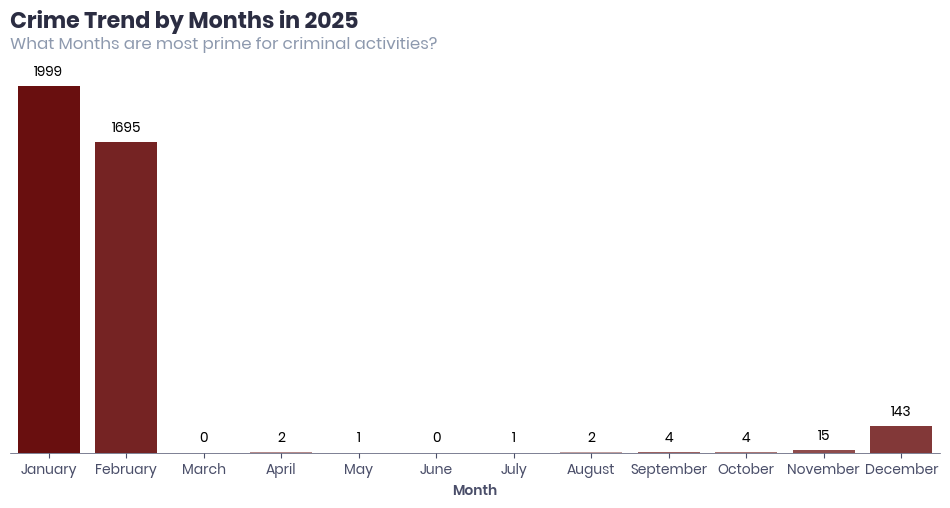

In [39]:
fig, ax = plt.subplots(figsize=(12, 5))

# Define correct month order
month_order = [
    "January",
    "February",
    "March",
    "April",
    "May",
    "June",
    "July",
    "August",
    "September",
    "October",
    "November",
    "December",
]

# Count crimes per month
month_counts = (
    cleaned_df.groupby("Start_Month").size().reindex(month_order, fill_value=0)
)

color_mapping = color_mapper(red_cmap, month_counts)

bars = sns.barplot(
    x=month_counts.index,
    y=month_counts.values,
    order=month_order,  # Maintain correct order
    palette=[color_mapping[month] for month in month_order],  # Apply color intensity
    ax=ax
);

default_settings(ax, "Crime Trend by Months in 2025", "What Months are most prime for criminal activities?")
ax.set_xlabel("Month", fontsize=10, fontfamily=font_family, fontweight='semibold', color=tick_color)
set_data_labels(ax, bars)

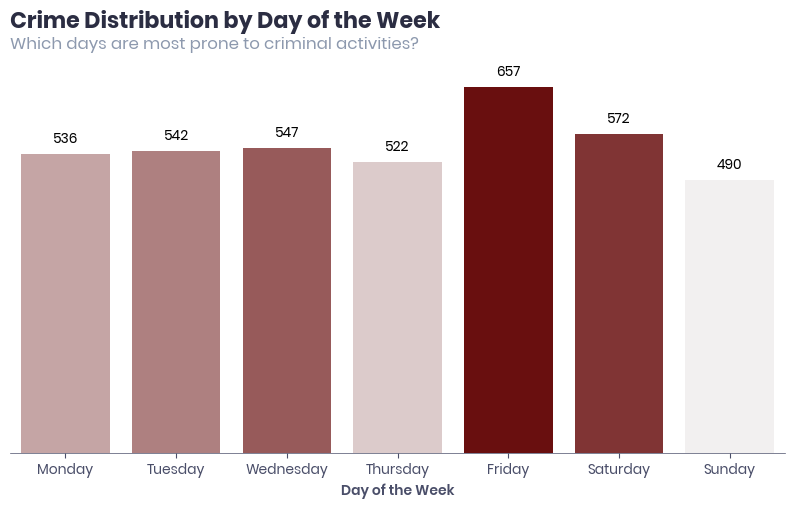

In [40]:
# Define correct weekday order
day_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]

# Count crimes per day, ensuring all days are present
day_counts = cleaned_df["Start_Day"].value_counts().reindex(day_order, fill_value=0)

# Normalize count values for color mapping (lighter for lower counts)
color_mapping = color_mapper(red_cmap, day_counts)

# Create the plot
fig, ax = plt.subplots(figsize=(10, 5))
bars = sns.barplot(
    x=day_counts.index,
    y=day_counts.values,
    order=day_order,
    palette=[color_mapping[day] for day in day_order],
    ax=ax
)

default_settings(ax, "Crime Distribution by Day of the Week", "Which days are most prone to criminal activities?")
ax.set_xlabel("Day of the Week", fontsize=10, fontfamily=font_family, fontweight='semibold', color=tick_color)
set_data_labels(ax, bars)
plt.show()

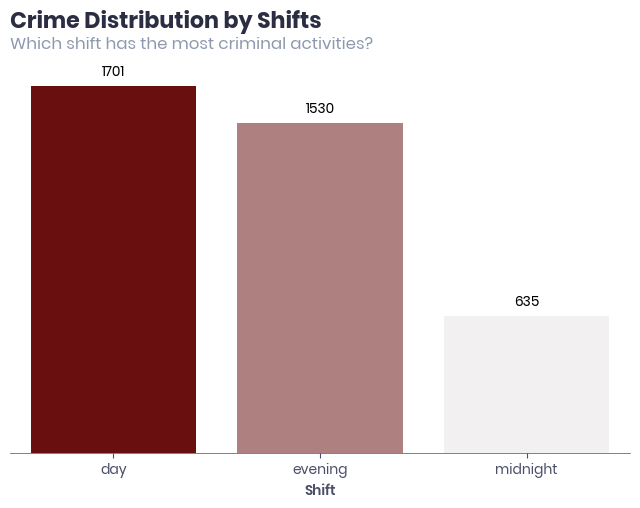

In [41]:
fig, ax = plt.subplots(figsize=(8, 5))

shift_counts = cleaned_df.groupby("SHIFT").size().sort_values(ascending=False)
color_mapping = color_mapper(red_cmap, shift_counts)

sns.countplot(
    data=cleaned_df,
    x="SHIFT",
    palette=[color_mapping[shift] for shift in shift_counts.index],
    order=cleaned_df["SHIFT"].value_counts().index,
    ax=ax
)
default_settings(ax, "Crime Distribution by Shifts", "Which shift has the most criminal activities?")
ax.set_xlabel("Shift", fontsize=10, fontfamily=font_family, fontweight='semibold', color=tick_color)
set_data_labels(ax, ax)

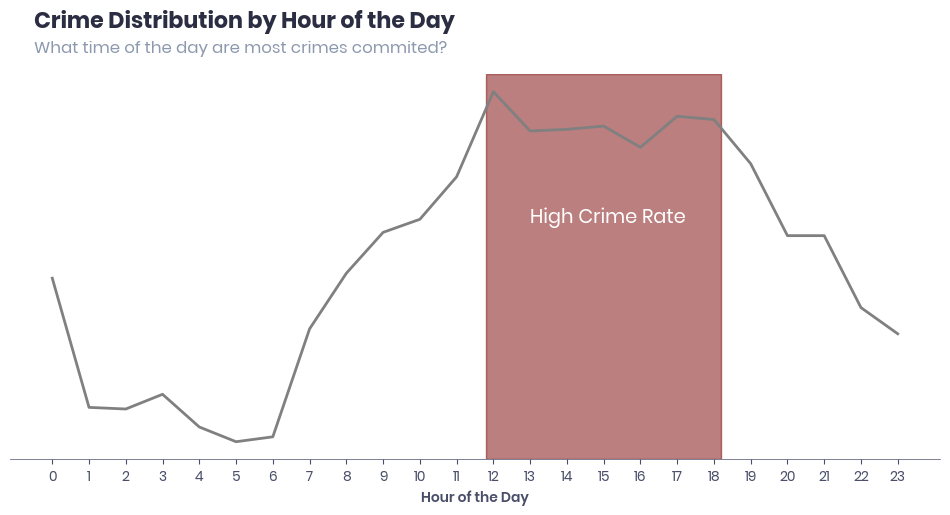

In [42]:
fig, ax = plt.subplots(figsize=(12, 5))
sns.lineplot(
    data=cleaned_df.groupby("Start_Hour").size().reset_index(name="count"),
    x="Start_Hour",
    y="count",
    color='gray',
    ax=ax
)

default_settings(ax, "Crime Distribution by Hour of the Day", "What time of the day are most crimes commited?")
ax.set_xlabel("Hour of the Day", fontsize=10, fontfamily=font_family, fontweight='semibold', color=tick_color)
ax.xaxis.set_ticks(np.arange(0, 24, 1))
ax.axvspan(11.8, 18.2, color=red_cmap, alpha=0.5)
ax.text(13, (ax.set_ylim()[1] / 1.5), "High Crime Rate", fontsize=14, fontfamily=font_family, color='white')
ax.lines[0].set_linewidth(2)
plt.show()

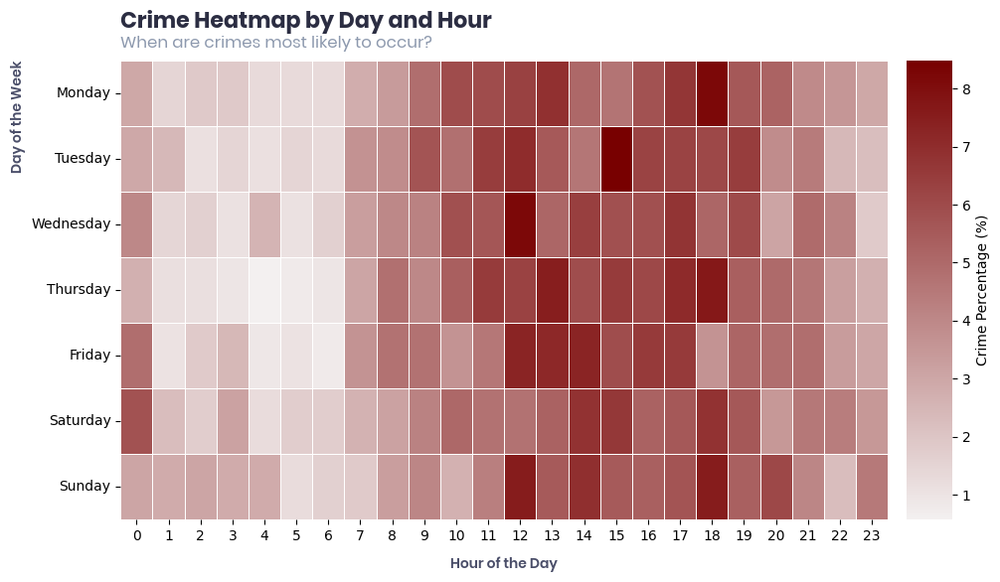

In [43]:
# Order days of the week correctly
day_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]

# Group by day and hour, then count crimes
day_hour_crime = (
    cleaned_df.groupby(["Start_Day", "Start_Hour"]).size().reset_index(name="count")
)

# Convert counts to percentages within each day
day_hour_crime["percentage"] = day_hour_crime.groupby("Start_Day")["count"].transform(
    lambda x: (x / x.sum()) * 100
)

# Pivot table for heatmap (Days as rows, Hours as columns)
heatmap_data = day_hour_crime.pivot(
    index="Start_Day", columns="Start_Hour", values="percentage"
)

# Reorder rows by weekday order
heatmap_data = heatmap_data.reindex(day_order)

# Plot heatmap
fig, ax = plt.subplots(figsize=(12, 6))
cbar_kws = {"label": "Crime Percentage (%)", "orientation": "vertical", "pad": 0.02, "aspect": 10}
cmap = sns.light_palette(red_cmap, as_cmap=True)
sns.heatmap(heatmap_data, cmap=cmap, linewidths=0.5, cbar=True, cbar_kws=cbar_kws, ax=ax)

# Customize labels
# default_settings(ax, "Crime Heatmap by Day and Hour", "When are crimes most likely to occur?")
ax.text(
    0,
    -0.5,
    "Crime Heatmap by Day and Hour",
    fontsize=title_size,
    fontweight="bold",
    fontfamily=font_family,
    color=title_color,
)
ax.text(
    0,
    -0.2,
    "When are crimes most likely to occur?",
    fontsize=subtitle_size,
    fontweight="regular",
    fontfamily="poppins",
    color=subtitle_color,
)
ax.set_xlabel("Hour of the Day", fontsize=10, fontfamily=font_family, fontweight='semibold', color=tick_color, labelpad=10)
ax.set_ylabel("Day of the Week", fontsize=10, fontfamily=font_family, fontweight='semibold', color=tick_color, loc='top')
plt.show()

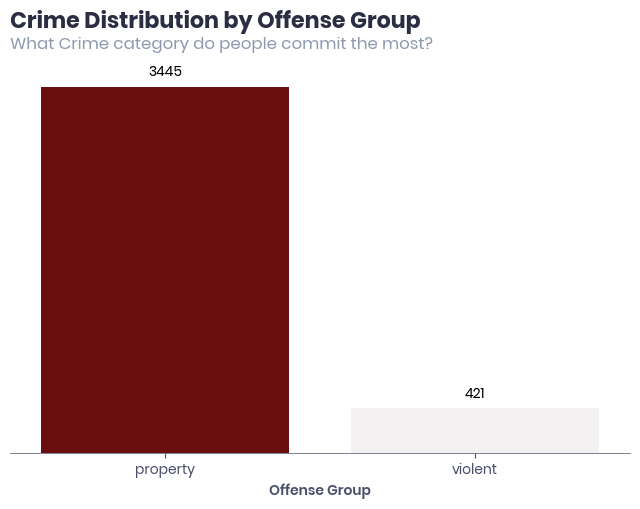

In [44]:
fig, ax = plt.subplots(figsize=(8, 5))


O = cleaned_df["OFFENSEGROUP"].value_counts()
color_mapping = color_mapper(red_cmap, O)


sns.countplot(
    data=cleaned_df,
    x="OFFENSEGROUP",
    palette=[color_mapping[offense] for offense in O.index],
    order=cleaned_df["OFFENSEGROUP"].value_counts().index,
    ax=ax,
)

default_settings(
    ax,
    "Crime Distribution by Offense Group",
    "What Crime category do people commit the most?",
)
ax.set_xlabel(
    "Offense Group",
    fontsize=10,
    fontfamily=font_family,
    fontweight="semibold",
    color=tick_color,
)
set_data_labels(ax, ax)

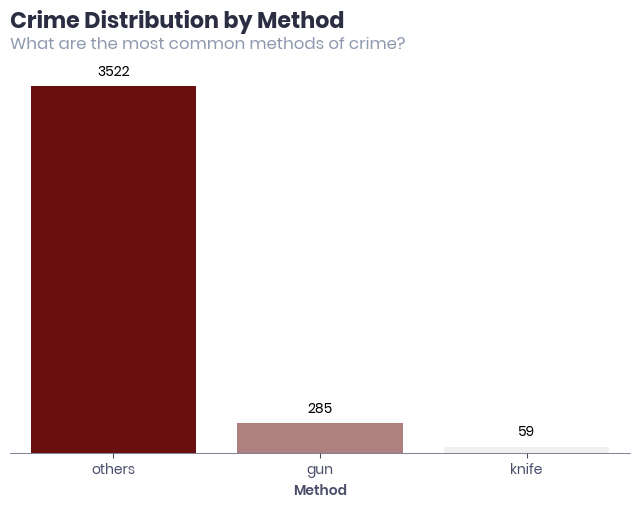

In [45]:
fig, ax = plt.subplots(figsize=(8, 5))

color_mapping = color_mapper(red_cmap, cleaned_df["METHOD"].value_counts())
sns.countplot(
    data=cleaned_df,
    x="METHOD",
    palette=[
        color_mapping[method] for method in cleaned_df["METHOD"].value_counts().index
    ],
    order=cleaned_df["METHOD"].value_counts().index,
    ax=ax,
)
default_settings(
    ax, "Crime Distribution by Method", "What are the most common methods of crime?"
)
ax.set_xlabel(
    "Method",
    fontsize=10,
    fontfamily=font_family,
    fontweight="semibold",
    color=tick_color,
)
set_data_labels(ax, ax)
plt.show()

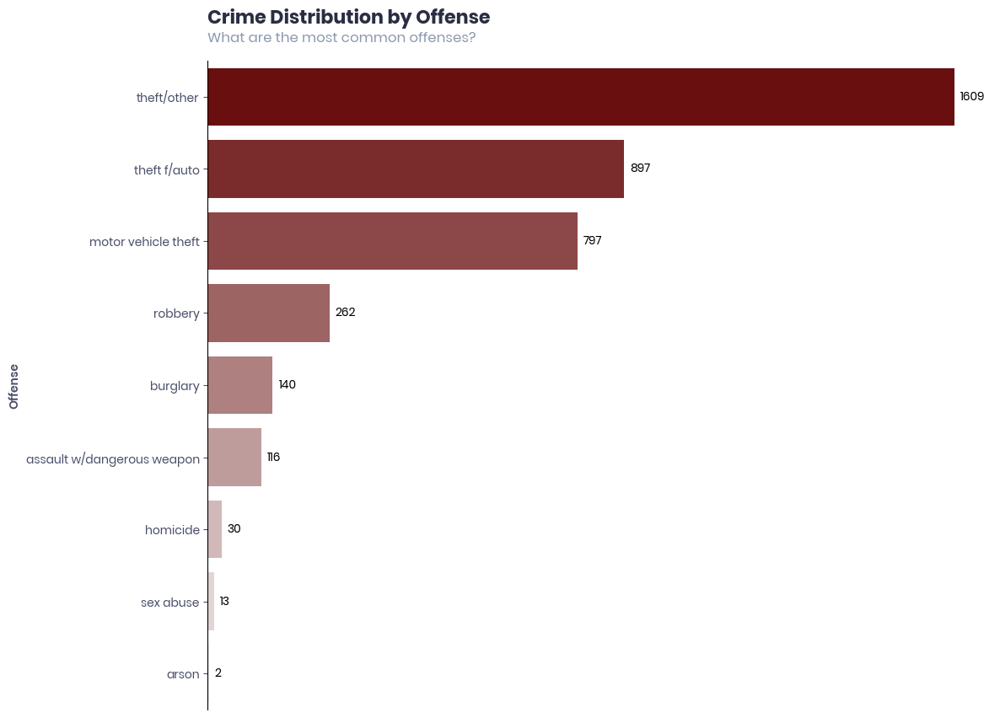

In [46]:
fig, ax  = plt.subplots(figsize=(12, 10))

color_mapping = color_mapper(red_cmap, cleaned_df["OFFENSE"].value_counts())
sns.countplot(
    data=cleaned_df,
    y="OFFENSE",
    palette=[color_mapping[offense] for offense in cleaned_df["OFFENSE"].value_counts().index],
    order=cleaned_df["OFFENSE"].value_counts().index,
    ax=ax
)
default_settings(ax, "Crime Distribution by Offense", "What are the most common offenses?", "h")
ax.set_ylabel("Offense", fontsize=10, fontfamily=font_family, fontweight='semibold', color=tick_color)
set_data_labels(ax, ax, "h")

#### Reporting Delay

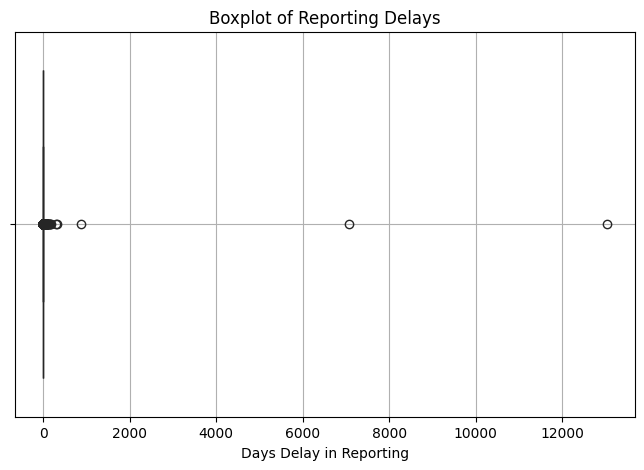

In [47]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=cleaned_df["Report_Delay_Days"], color="purple")

plt.xlabel("Days Delay in Reporting")
plt.title("Boxplot of Reporting Delays")
plt.grid()
plt.show()

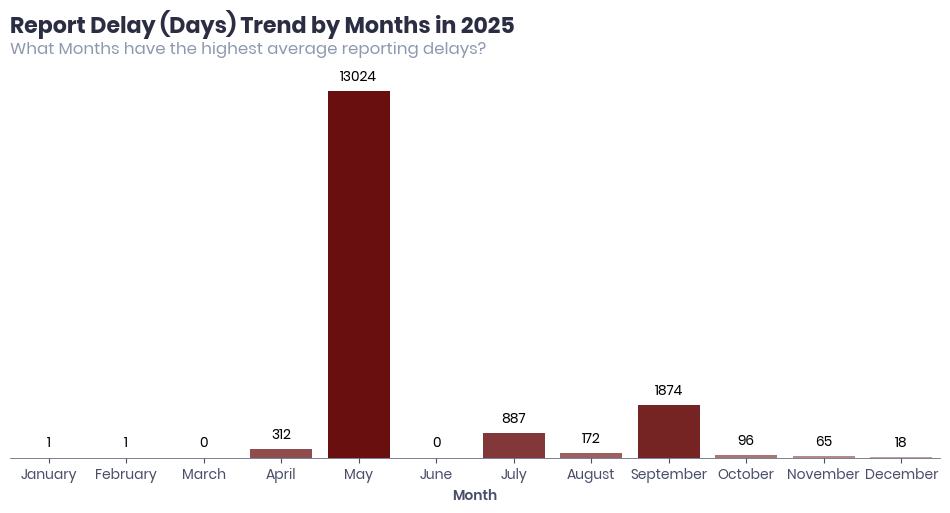

In [48]:
fig, ax = plt.subplots(figsize=(12, 5))

# Define correct month order
month_order = [
    "January",
    "February",
    "March",
    "April",
    "May",
    "June",
    "July",
    "August",
    "September",
    "October",
    "November",
    "December",
]

# Count crimes per month
month_avg_RD = (
    cleaned_df.groupby("Start_Month").agg({"Report_Delay_Days": "mean"}).reindex(month_order, fill_value=0)
)

color_mapping = color_mapper(red_cmap, month_avg_RD["Report_Delay_Days"])

bars = sns.barplot(
    x=month_avg_RD["Report_Delay_Days"].index,
    y=month_avg_RD["Report_Delay_Days"].values,
    order=month_order,  # Maintain correct order
    palette=[color_mapping[month] for month in month_order],  # Apply color intensity
    ax=ax,
)

default_settings(
    ax,
    "Report Delay (Days) Trend by Months in 2025",
    "What Months have the highest average reporting delays?",
)
ax.set_xlabel(
    "Month",
    fontsize=10,
    fontfamily=font_family,
    fontweight="semibold",
    color=tick_color,
)
set_data_labels(ax, bars)

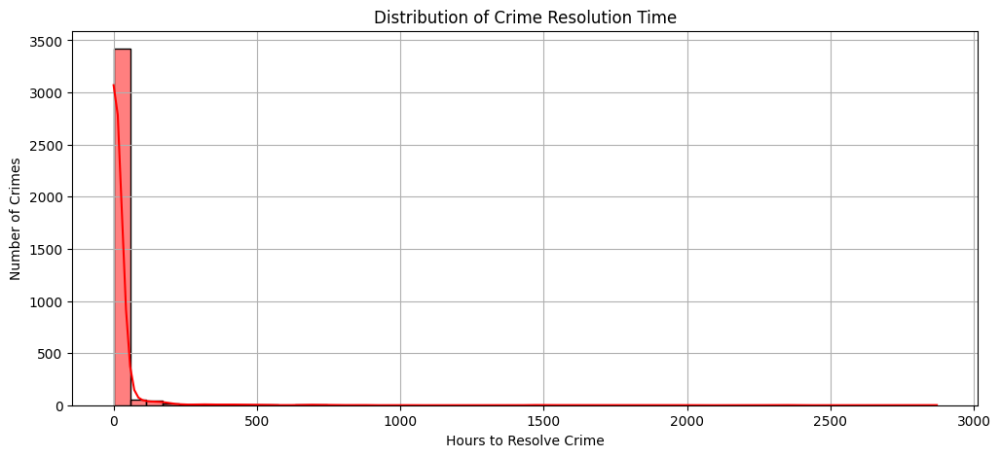

In [49]:
plt.figure(figsize=(12, 5))
resolution_time = (
    cleaned_df["END_DATE"] - cleaned_df["START_DATE"]
).dt.total_seconds() / 3600  # Convert to hours
sns.histplot(resolution_time.dropna(), bins=50, kde=True, color="red")

plt.xlabel("Hours to Resolve Crime")
plt.ylabel("Number of Crimes")
plt.title("Distribution of Crime Resolution Time")
plt.grid()
plt.show()

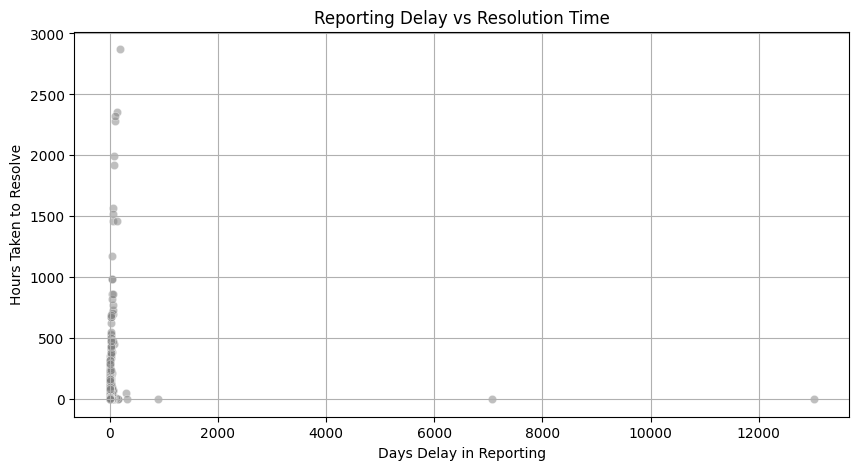

In [50]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x=cleaned_df["Report_Delay_Days"], y=resolution_time, alpha=0.5)

plt.xlabel("Days Delay in Reporting")
plt.ylabel("Hours Taken to Resolve")
plt.title("Reporting Delay vs Resolution Time")
plt.grid()
plt.show()

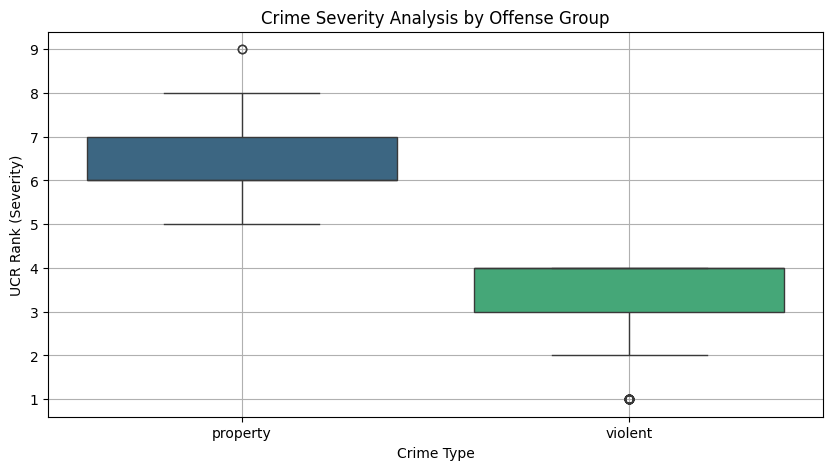

In [51]:
plt.figure(figsize=(10, 5))
sns.boxplot(data=cleaned_df, x="OFFENSEGROUP", y="UCR-RANK", palette="viridis")
plt.xlabel("Crime Type")
plt.ylabel("UCR Rank (Severity)")
plt.title("Crime Severity Analysis by Offense Group")
plt.grid()
plt.show()

<Figure size 1200x600 with 0 Axes>

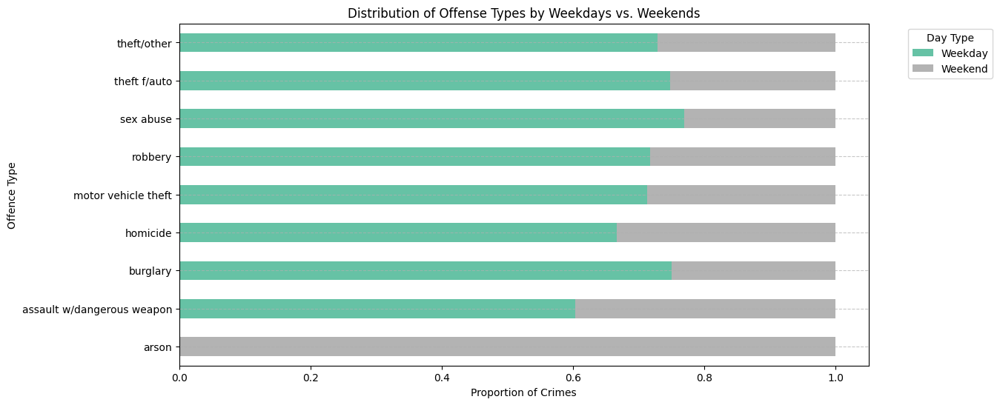

In [52]:
# Categorize into Weekday or Weekend
cleaned_df["Day_Type"] = cleaned_df["Start_Day"].apply(
    lambda x: "Weekend" if x in ["Saturday", "Sunday"] else "Weekday"
)

# Count of offenses by category
offense_counts = cleaned_df.groupby(["OFFENSE", "Day_Type"]).size().unstack()

# Normalize to get proportions
offense_distribution = offense_counts.div(offense_counts.sum(axis=1), axis=0)

# Plot normalized stacked bar chart
plt.figure(figsize=(12, 6))
offense_distribution.plot(kind="barh", stacked=True, colormap="Set2",  figsize=(12, 6))

plt.title("Distribution of Offense Types by Weekdays vs. Weekends")
plt.ylabel("Offence Type")
plt.xlabel("Proportion of Crimes")
plt.xticks(rotation=0)
plt.legend(title="Day Type", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

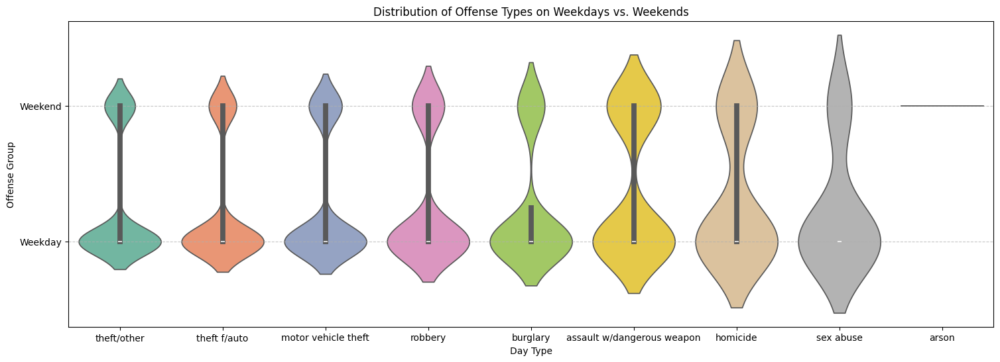

In [53]:
plt.figure(figsize=(18, 6))
sns.violinplot(x="OFFENSE", y="Day_Type", data=cleaned_df, palette="Set2")

plt.title("Distribution of Offense Types on Weekdays vs. Weekends")
plt.xlabel("Day Type")
plt.ylabel("Offense Group")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

<Figure size 1200x600 with 0 Axes>

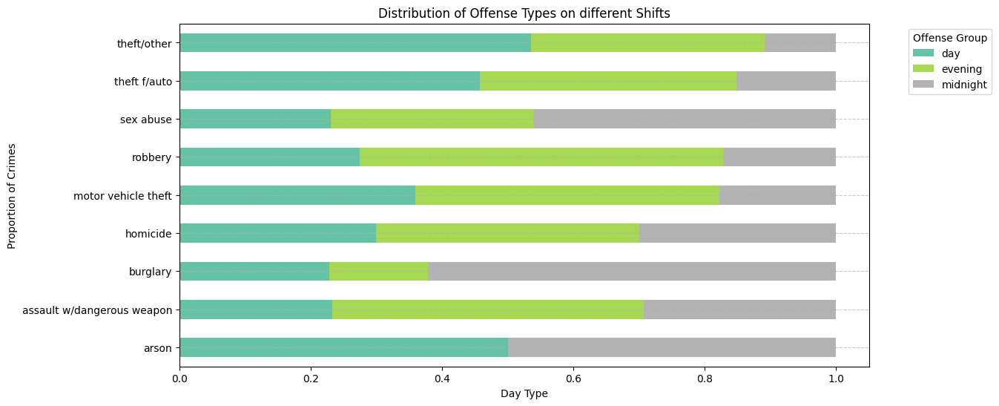

In [54]:
offense_counts = cleaned_df.groupby(["OFFENSE", "SHIFT"]).size().unstack()

# Normalize to get proportions
offense_distribution = offense_counts.div(offense_counts.sum(axis=1), axis=0)

# Plot normalized stacked bar chart
plt.figure(figsize=(12, 6))
offense_distribution.plot(kind="barh", stacked=True, colormap="Set2", figsize=(12, 6))

plt.title("Distribution of Offense Types on different Shifts")
plt.xlabel("Day Type")
plt.ylabel("Proportion of Crimes")
plt.xticks(rotation=0)
plt.legend(title="Offense Group", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

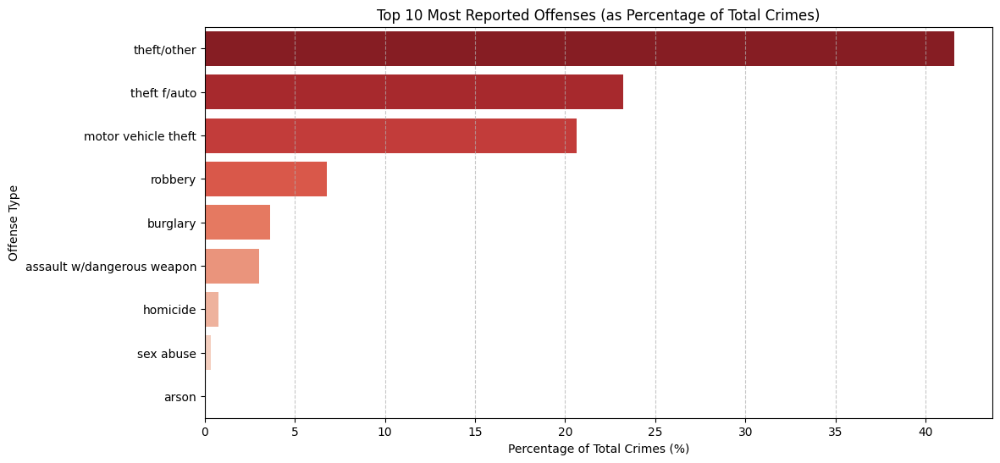

In [55]:
# Total offenses per type
offense_counts = cleaned_df["OFFENSE"].value_counts()

# Total crimes (to normalize)
total_crimes = len(cleaned_df)

# Calculate percentage
offense_percentage = (offense_counts / total_crimes) * 100

# Take the top 10 offenses
top_offenses = offense_percentage.head(10)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=top_offenses.values, y=top_offenses.index, palette="Reds_r")

plt.xlabel("Percentage of Total Crimes (%)")
plt.ylabel("Offense Type")
plt.title("Top 10 Most Reported Offenses (as Percentage of Total Crimes)")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()

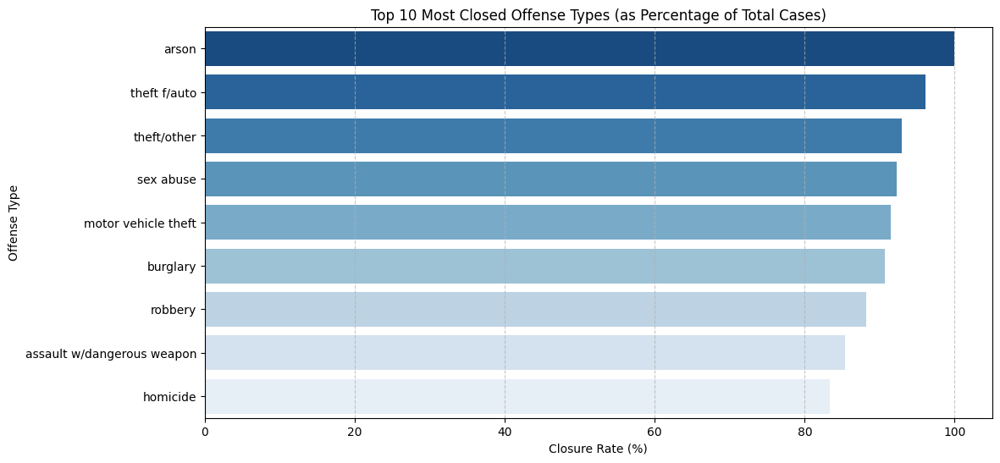

In [56]:
# Filter cases that have an END_DATE (i.e., resolved cases)
closed_cases = cleaned_df[cleaned_df["END_DATE"].notna()]

# Count how many times each offense type appears in resolved cases
closed_offense_counts = closed_cases["OFFENSE"].value_counts()

# Total cases per offense type (to normalize)
total_offense_counts = cleaned_df["OFFENSE"].value_counts()

# Calculate closure rate (percentage of cases resolved per offense type)
closure_rate = (closed_offense_counts / total_offense_counts) * 100

# Drop NaNs (cases where an offense type has no closed cases)
closure_rate = closure_rate.dropna()

# Take the top 10 offenses with the highest closure rates
top_closed_offenses = closure_rate.sort_values(ascending=False).head(10)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(
    x=top_closed_offenses.values, y=top_closed_offenses.index, palette="Blues_r"
)

plt.xlabel("Closure Rate (%)")
plt.ylabel("Offense Type")
plt.title("Top 10 Most Closed Offense Types (as Percentage of Total Cases)")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()

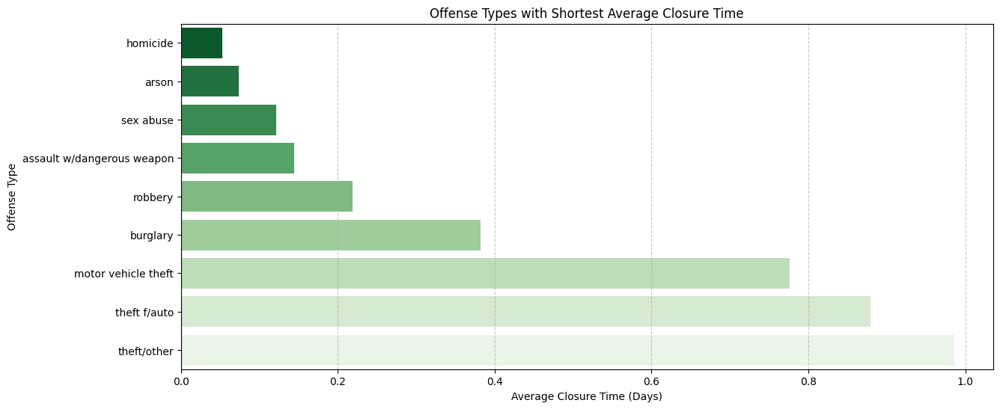

In [57]:
# Calculate closure duration (in days)
cleaned_df["Closure_Duration"] = (
    cleaned_df["END_DATE"] - cleaned_df["START_DATE"]
).dt.total_seconds() / (
    60 * 60 * 24
)  # Convert seconds to days

# Filter out negative or NaN durations (if any)
valid_durations = cleaned_df[cleaned_df["Closure_Duration"] >= 0]

# Compute average closure time per offense type
avg_closure_time = (
    valid_durations.groupby("OFFENSE")["Closure_Duration"].mean().sort_values()
)

# Plot the offenses with the longest and shortest avg closure times (Top 10 each)
plt.figure(figsize=(14, 6))

# Plot the fastest closed offenses (shortest avg closure time)
sns.barplot(
    x=avg_closure_time.head(10).values,
    y=avg_closure_time.head(10).index,
    palette="Greens_r",
)
plt.xlabel("Average Closure Time (Days)")
plt.ylabel("Offense Type")
plt.title("Offense Types with Shortest Average Closure Time")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()

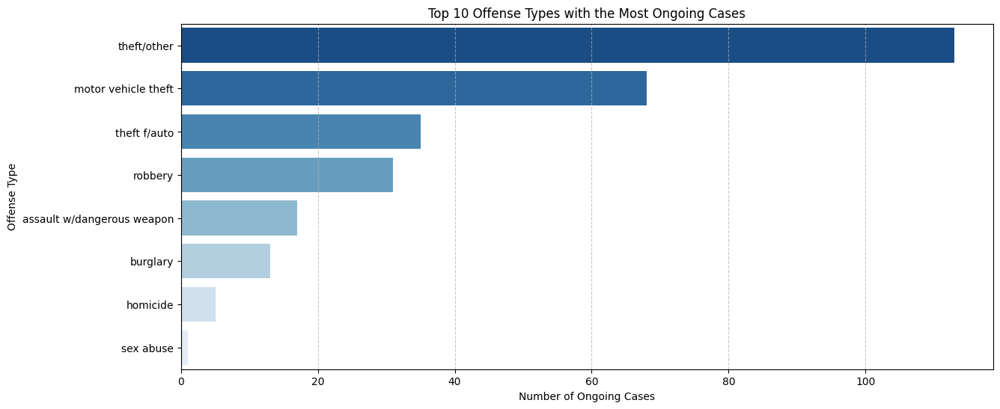

In [58]:
# Filter for ongoing cases (END_DATE is NaN)
ongoing_cases = cleaned_df[cleaned_df["END_DATE"].isna()]

# Count ongoing cases per offense type
ongoing_counts = ongoing_cases["OFFENSE"].value_counts()

# Plot the top 10 offenses with the highest number of ongoing cases
plt.figure(figsize=(14, 6))
sns.barplot(
    x=ongoing_counts.head(10).values, y=ongoing_counts.head(10).index, palette="Blues_r"
)

plt.xlabel("Number of Ongoing Cases")
plt.ylabel("Offense Type")
plt.title("Top 10 Offense Types with the Most Ongoing Cases")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()

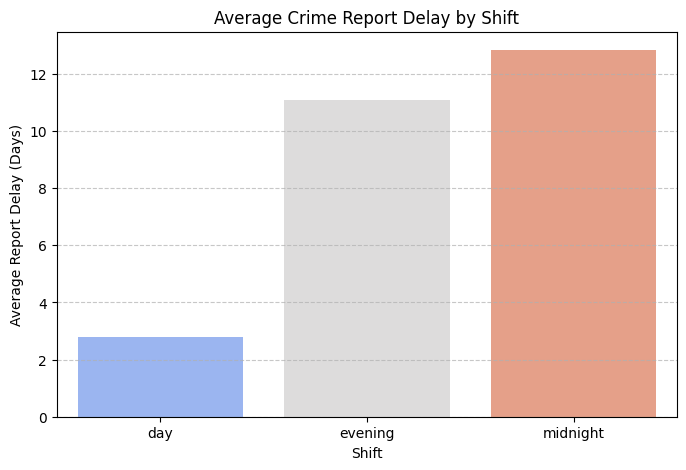

In [59]:
# Calculate average report delay by shift
shift_delay = cleaned_df.groupby("SHIFT")["Report_Delay_Days"].mean().sort_values()

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(x=shift_delay.index, y=shift_delay.values, palette="coolwarm")

# Labels and formatting
plt.xlabel("Shift")
plt.ylabel("Average Report Delay (Days)")
plt.title("Average Crime Report Delay by Shift")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

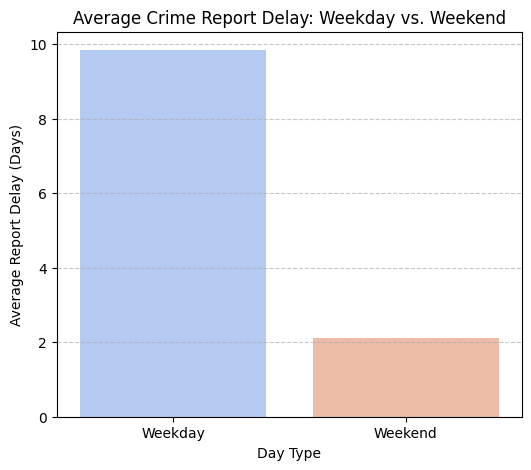

In [60]:
# Define weekday and weekend
cleaned_df["Is_Weekend"] = cleaned_df["Start_Day"].isin(["Saturday", "Sunday"])

# Calculate average delay
weekend_delay = cleaned_df.groupby("Is_Weekend")["Report_Delay_Days"].mean()

# Plot
plt.figure(figsize=(6, 5))
sns.barplot(x=weekend_delay.index, y=weekend_delay.values, palette="coolwarm")

# Labels and formatting
plt.xticks([0, 1], ["Weekday", "Weekend"])
plt.xlabel("Day Type")
plt.ylabel("Average Report Delay (Days)")
plt.title("Average Crime Report Delay: Weekday vs. Weekend")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

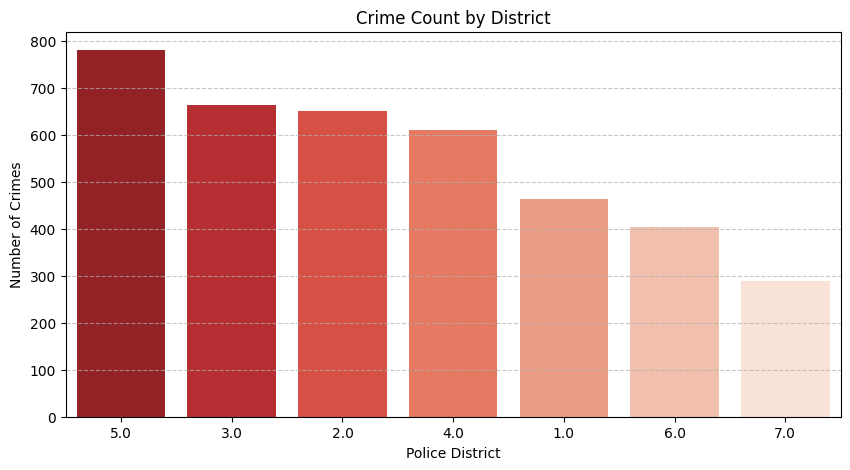

In [61]:
# Count crimes per district
crime_by_district = cleaned_df["DISTRICT"].value_counts().sort_values(ascending=False)

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(x=crime_by_district.index, y=crime_by_district.values, palette="Reds_r")

# Labels and formatting
plt.xlabel("Police District")
plt.ylabel("Number of Crimes")
plt.title("Crime Count by District")
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

In [62]:
geojson_path = "../map/Neighborhood_Clusters.geojson"  # Adjust the file path
dc_map = gpd.read_file(geojson_path)

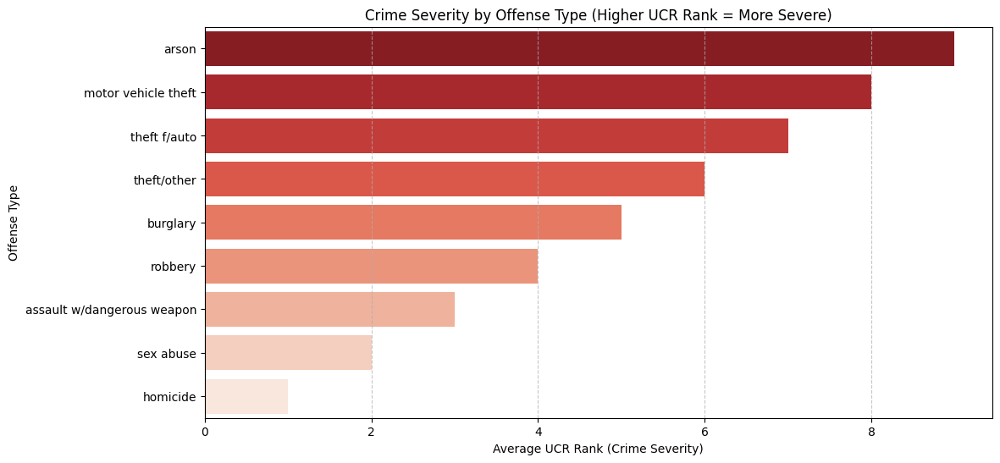

In [63]:
# Group by Offense and calculate the mean UCR Rank
ucr_severity = (
    cleaned_df.groupby("OFFENSE")["UCR-RANK"].mean().sort_values(ascending=False)
)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=ucr_severity.values, y=ucr_severity.index, palette="Reds_r")

# Labels & Title
plt.xlabel("Average UCR Rank (Crime Severity)")
plt.ylabel("Offense Type")
plt.title("Crime Severity by Offense Type (Higher UCR Rank = More Severe)")
plt.grid(axis="x", linestyle="--", alpha=0.7)

plt.show()

In [64]:
temp_df = cleaned_df.copy()
temp_df.rename(columns={"OFFENSE": "Offence", "Start_Hour": "Hour"}, inplace=True)
# Define the magnify function
def magnify():
    return [
        {
            "selector": "th",
            "props": [
                ("font-size", "10pt"),
                ("text-align", "center"),
                ("background", "#2B2D42"),
                ("color", "white"),
            ],
        },
        {"selector": "td:hover", "props": [("font-size", "12pt")]},  # Magnify effect
    ]


# Create a crime count pivot table (BIDs x Hours)
hourly_crime_df = temp_df.pivot_table(
    index="Offence", columns="Hour", aggfunc="size", fill_value=0
)

# Normalize by row (percentage per BID)
hourly_crime_pct = hourly_crime_df.div(hourly_crime_df.sum(axis=1), axis=0) * 100

# Apply white-to-red gradient
cmap = sns.light_palette("#c1121f", as_cmap=True)  # Lightest (white) to darkest (red)
styled_table = (
    hourly_crime_pct.style.background_gradient(cmap, axis=1)  # Apply heatmap effect
    .set_properties(**{"max-width": "80px", "font-size": "1pt"})  # Optimize readability
    .set_caption("🚔 Crime Distribution Across Hours by BID (Hover to magnify)")
    .format("{:.1f}%")  # Show 1 decimal for percentages
    .set_table_styles(magnify())
)

styled_table

Hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
Offence,,,,,,,,,,,,,,,,,,,,,,,,
arson,50.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,50.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%
assault w/dangerous weapon,8.6%,4.3%,6.0%,1.7%,6.0%,1.7%,0.0%,0.9%,0.9%,0.9%,3.4%,3.4%,1.7%,2.6%,6.0%,4.3%,4.3%,4.3%,6.9%,6.9%,8.6%,3.4%,4.3%,8.6%
burglary,6.4%,2.1%,10.7%,14.3%,10.0%,7.1%,4.3%,7.1%,5.0%,4.3%,2.9%,1.4%,2.9%,4.3%,0.7%,1.4%,5.0%,2.9%,0.7%,0.7%,0.7%,2.1%,1.4%,1.4%
homicide,10.0%,3.3%,3.3%,6.7%,0.0%,6.7%,0.0%,0.0%,0.0%,6.7%,0.0%,6.7%,3.3%,6.7%,6.7%,0.0%,6.7%,6.7%,6.7%,0.0%,3.3%,13.3%,3.3%,0.0%
motor vehicle theft,3.9%,2.3%,0.8%,1.5%,1.5%,1.6%,2.4%,3.9%,4.5%,4.1%,4.4%,3.6%,3.9%,5.4%,5.1%,4.8%,5.8%,6.8%,6.4%,5.8%,5.1%,7.4%,5.3%,3.8%
robbery,6.9%,2.3%,1.1%,2.3%,0.4%,1.1%,1.5%,1.5%,0.4%,1.5%,2.3%,2.7%,5.3%,4.6%,3.4%,7.3%,5.0%,6.9%,7.6%,9.2%,9.5%,6.9%,6.1%,4.2%
sex abuse,7.7%,15.4%,15.4%,0.0%,7.7%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,7.7%,15.4%,0.0%,0.0%,7.7%,7.7%,0.0%,0.0%,7.7%,7.7%
theft f/auto,4.8%,1.8%,2.0%,1.7%,1.1%,0.6%,0.9%,2.3%,3.0%,5.0%,4.9%,5.7%,8.1%,6.6%,6.0%,6.4%,5.6%,5.9%,6.2%,5.4%,4.5%,4.7%,3.8%,3.1%
theft/other,2.0%,1.1%,1.0%,1.2%,0.7%,0.8%,0.9%,3.1%,4.9%,5.3%,5.7%,7.1%,8.5%,7.0%,7.7%,7.3%,6.5%,6.9%,6.6%,5.6%,3.5%,2.7%,1.8%,2.0%


Here are the **insights** derived from the crime distribution across hours by offense type:

---

### **1. Arson**
- **Insight:** Arson incidents are concentrated at **midnight (50%)** and **noon (50%)**, with no occurrences during other hours.
- **Implication:** Law enforcement should focus on these specific times to monitor and prevent arson-related activities, especially in areas prone to such crimes.

---

### **2. Assault with a Dangerous Weapon**
- **Insight:** Assaults peak at **8 PM (8.6%)** and **midnight (8.6%)**, with secondary peaks at **6 PM (6.9%)** and **7 PM (6.9%)**.
- **Implication:** Increased police presence and community safety measures should be prioritized during evening and late-night hours to deter violent crimes.

---

### **3. Burglary**
- **Insight:** Burglaries are most frequent during **early morning hours**, with peaks at **3 AM (14.3%)** and **2 AM (10.7%)**.
- **Implication:** Nighttime patrols and enhanced security measures (e.g., surveillance, lighting) should be implemented to reduce burglary rates during these vulnerable hours.

---

### **4. Homicide**
- **Insight:** Homicides are spread across various hours, with notable peaks at **9 PM (13.3%)** and **midnight (10.0%)**.
- **Implication:** Law enforcement should focus on late evening and nighttime hours, particularly in high-risk areas, to prevent violent crimes.

---

### **5. Motor Vehicle Theft**
- **Insight:** Motor vehicle thefts are most common during **late afternoon and evening hours**, with peaks at **9 PM (7.4%)** and **6 PM (6.8%)**.
- **Implication:** Increased patrols and public awareness campaigns should target these hours to reduce vehicle theft incidents.

---

### **6. Robbery**
- **Insight:** Robberies peak during **evening hours**, with the highest rates at **8 PM (9.5%)** and **7 PM (9.2%)**.
- **Implication:** Evening patrols and community safety initiatives should be intensified to address robbery hotspots during these times.

---

### **7. Sex Abuse**
- **Insight:** Sex abuse incidents are concentrated at **1 AM (15.4%)** and **2 AM (15.4%)**, with another peak at **3 PM (15.4%)**.
- **Implication:** Special attention should be given to early morning and afternoon hours, with increased security and support services in areas with higher reported incidents.

---

### **8. Theft from Auto**
- **Insight:** Theft from auto peaks at **noon (8.1%)** and **1 PM (6.6%)**, with a gradual decline throughout the day.
- **Implication:** Midday patrols and public awareness campaigns should focus on preventing thefts from vehicles, especially in high-traffic areas.

---

### **9. Theft/Other**
- **Insight:** Theft/other crimes are most frequent during **midday hours**, with peaks at **noon (8.5%)** and **1 PM (7.0%)**.
- **Implication:** Law enforcement should prioritize midday patrols and community engagement to reduce theft-related crimes during these hours.

---

### **Key Recommendations**
1. **Targeted Policing:** Focus on peak crime hours for each offense type to maximize resource efficiency.
2. **Enhanced Surveillance:** Increase surveillance and lighting in high-crime areas during vulnerable hours.
3. **Community Engagement:** Launch public awareness campaigns to educate residents about crime prevention strategies.
4. **Resource Allocation:** Reallocate resources from low-crime hours to high-crime hours to optimize law enforcement efforts.
5. **Tailored Strategies:** Develop area-specific strategies based on unique crime patterns, such as increased patrols during early morning hours for burglaries and evening hours for robberies.

---

These insights can be visualized using **Tableau dashboards** and presented to stakeholders in a **PowerPoint presentation** for actionable decision-making. Let me know if you'd like help creating these deliverables! 😊

In [65]:
cleaned_df.columns

Index(['ANC', 'LATITUDE', 'BLOCK', 'OFFENSEGROUP', 'LOCATION', 'SECTOR',
       'YBLOCK', 'METHOD', 'CCN', 'END_DATE', 'LONGITUDE',
       'NEIGHBORHOOD_CLUSTER', 'SHIFT', 'PSA', 'CENSUS_TRACT', 'WARD', 'BID',
       'DISTRICT', 'XBLOCK', 'YEAR', 'REPORT_DATE', 'UCR-RANK', 'START_DATE',
       'VOTING_PRECINCT', 'OFFENSE', 'BLOCK_GROUP', 'Duration_Issue',
       'Report_Delay_Days', 'Resolution_Before_Report', 'Missing_Start_Date',
       'Missing_End_Date', 'Ongoing_Crime_Flag', 'BID_Status', 'End_Hour',
       'End_Day', 'End_Month', 'Report_Hour', 'Report_Day', 'Report_Month',
       'Start_Hour', 'Start_Day', 'Start_Month', 'Day_Type',
       'Closure_Duration', 'Is_Weekend'],
      dtype='object')

In [66]:
cleaned_df['Resolution_Time'] = (cleaned_df['END_DATE'] - cleaned_df['START_DATE']).dt.total_seconds() / 3600

In [67]:
# Group by BID
bid_summary = (
    cleaned_df.groupby("OFFENSE")
    .agg( # Most common crime
        Hottest_Hour=(
            "Start_Hour",
            lambda x: x.value_counts().idxmax(),
        ),  # Most frequent crime hour
        Avg_Resolution_Time=("Resolution_Time", "mean"),  # Avg resolution time
        Open_Case_Percentage=(
            "Ongoing_Crime_Flag",
            lambda x: (x.sum() / len(x)) * 100,
        ),  # % Open Cases
        Total_Crimes=("BID", "count"),  # Total crimes in the BID
        Avg_Report_Delay=("Report_Delay_Days", "mean"),  # Avg reporting delay
    )
    .reset_index()
)

# Style the table
cmap = sns.light_palette("#c1121f", as_cmap=True)
styled_table = (
    bid_summary.style.background_gradient(
        cmap,
        subset=["Avg_Resolution_Time", "Avg_Report_Delay"],
    )
    .format(
        {
            "Avg_Resolution_Time": "{:.2f} hrs",
            "Open_Case_Percentage": "{:.1f}%",
            "Avg_Report_Delay": "{:.2f} days",
        }
    )
    .set_caption("🚔 Crime Analysis by BID Area")
    .set_properties(**{"text-align": "center", "border": "1px solid black"})
    .set_table_styles(
        [
            {
                "selector": "th",
                "props": [
                    ("background-color", "#8D99AE"),
                    ("color", "#2B2D42"),
                    ("font-size", "12px"),
                ],
            },
            {
                "selector": "td",
                "props": [("border", "1px solid #f0f0f0"), ("padding", "6px")],
            },
        ]
    )
    .bar(subset=["Open_Case_Percentage"], cmap="Reds")  # Red color for high open case %
    .bar(subset=["Total_Crimes"], cmap="Blues")  # Blue color for total crime count
)

styled_table

,OFFENSE,Hottest_Hour,Avg_Resolution_Time,Open_Case_Percentage,Total_Crimes,Avg_Report_Delay
0,arson,0,1.76 hrs,0.0%,0,0.00 days
1,assault w/dangerous weapon,20,3.46 hrs,12.1%,14,0.03 days
2,burglary,3,9.17 hrs,8.6%,26,0.31 days
3,homicide,21,1.27 hrs,63.3%,4,711.20 days
4,motor vehicle theft,21,18.62 hrs,5.9%,104,0.73 days
5,robbery,20,5.24 hrs,8.8%,32,0.10 days
6,sex abuse,1,2.91 hrs,0.0%,2,24.69 days
7,theft f/auto,12,21.10 hrs,3.6%,141,2.55 days
8,theft/other,12,23.67 hrs,3.4%,363,3.26 days


### Business Improvement Districts (BIDs) 

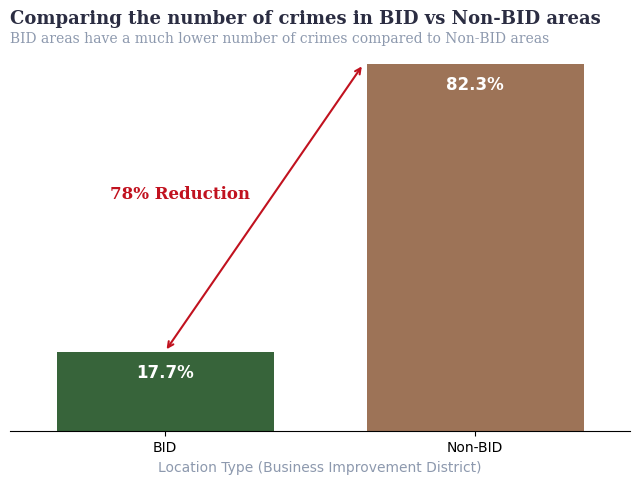

In [68]:
# Calculate percentage of crimes in each category
crimes_in_bid = cleaned_df.groupby("BID_Status").size().reset_index(name="Crime_Count")
crimes_in_bid["Crime_Percentage"] = (
    crimes_in_bid["Crime_Count"] / crimes_in_bid["Crime_Count"].sum()
) * 100

# Plot
fig, ax = plt.subplots(figsize=(8, 5))
bars = sns.barplot(
    data=crimes_in_bid,
    x="BID_Status",
    y="Crime_Percentage",
    width=0.7,
    palette=["#306b34", "#a9714b"],  # Distinct colors for contrast
    ax=ax,
)

# Labels
ax.set_xlabel(
    "Location Type (Business Improvement District)", fontsize=10, color="#8D99AE"
)
ax.yaxis.set_visible(False)
ax.spines[["top", "right", "left"]].set_visible(False)
# Add title and subtitle with improved alignment
ax.text(
    -0.5,
    ax.get_ylim()[1] + 5,
    "Comparing the number of crimes in BID vs Non-BID areas",
    fontsize=13,
    fontweight="bold",
    fontfamily="serif",
    color="#2B2D42",
)
ax.text(
    -0.5,
    ax.get_ylim()[1] + 0.7,
    "BID areas have a much lower number of crimes compared to Non-BID areas",
    fontsize=10,
    fontweight="light",
    fontfamily="serif",
    color="#8D99AE",
)

# Add data labels inside the bars
for p in bars.patches:
    ax.annotate(
        f"{p.get_height():.1f}%",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="center",
        xytext=(0, -15),
        textcoords="offset points",
        fontsize=12,
        color="white",
        fontweight="bold",
    )

# **Arrow Annotation (78% difference)**
x1, y1 = (
    bars.patches[1].get_x(),
    bars.patches[1].get_height(),
)  # Non-BID
x2, y2 = (
    bars.patches[0].get_x() + bars.patches[0].get_width() / 2,
    bars.patches[0].get_height(),
)  # BID

ax.annotate(
    "",
    xy=(x1 - 0.01, y1),
    xytext=(x2, y2 + 0.02),
    arrowprops=dict(arrowstyle="<->", color="#c1121f", linewidth=1.5),
)

# Add 78% text label near the arrow
ax.text(
    x2 + 0.05,
    (y1 + y2) / 2 + 2,
    "78% Reduction",
    fontsize=12,
    fontweight="bold",
    fontfamily="serif",
    color="#c1121f",
    ha="center",
)

plt.show()

1. Crime Reduction in BID Areas
Insight: Business Improvement District (BID) areas exhibit a 78% reduction in crime compared to Non-BID areas, with only 17.7% of crimes occurring in BID zones. This significant disparity highlights the effectiveness of BID initiatives in enhancing safety and security.

Implication: The presence of BIDs, which often include enhanced surveillance, community policing, and improved infrastructure, plays a critical role in deterring criminal activities. Expanding BID programs to Non-BID areas could further reduce overall crime rates.

- Business Improvement Districts (BIDs) are commercial areas managed by a non-profit organization, funded through a special tax on businesses. Their goal is to enhance the local economy and improve safety for residents and visitors.
- The dataset includes 19 BIDs across Washington, D.C., such as Adams Morgan, Capitol Hill, Downtown, Georgetown, and U Street.
- Crime rates in BID areas are significantly lower—with only 686 crimes reported, compared to 3,180 crimes in non-BID areas. This represents a 78% reduction in crime.

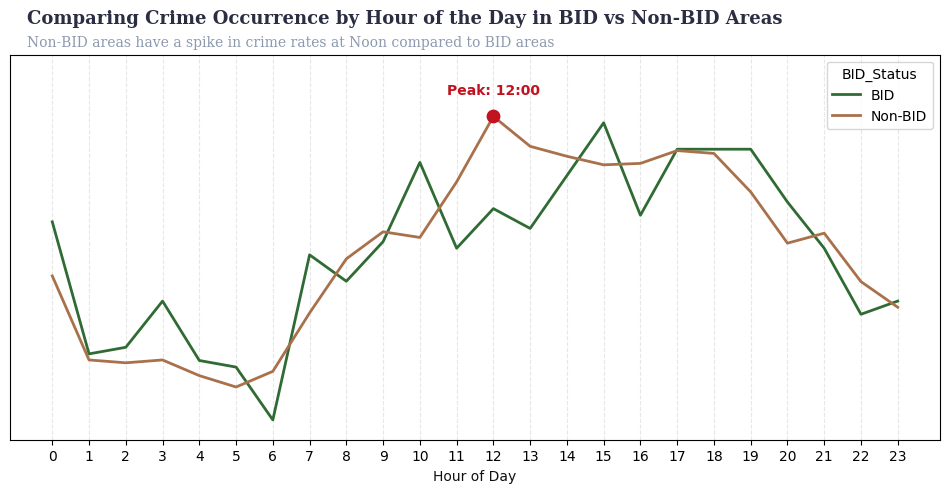

In [69]:
fig, ax = plt.subplots(figsize=(12, 5))

# Normalize crime counts per category
crime_by_hour = (
    cleaned_df.groupby(["Start_Hour", "BID_Status"]).size().reset_index(name="Count")
)

# Normalize within each BID_Status category
crime_by_hour["Proportion"] = crime_by_hour.groupby("BID_Status")["Count"].transform(
    lambda x: x / x.sum()
)


# Plot
sns.lineplot(
    data=crime_by_hour,
    x="Start_Hour",
    y="Proportion",
    hue="BID_Status",
    ax=ax,
    palette=["#306b34", "#a9714b"],
    linewidth=2,
)
ax.set_ylim(0, 0.085)
# Titles
ax.text(
    -0.7,
    ax.get_ylim()[1] + 0.007,
    "Comparing Crime Occurrence by Hour of the Day in BID vs Non-BID Areas",
    fontsize=13,
    fontweight="bold",
    fontfamily="serif",
    color="#2b2d42",
)
ax.text(
    -0.7,
    ax.get_ylim()[1] + 0.002,
    "Non-BID areas have a spike in crime rates at Noon compared to BID areas",
    fontsize=10,
    fontweight="light",
    fontfamily="serif",
    color="#8d99ae",
)

# Hide y-axis for cleaner look
ax.yaxis.set_visible(False)

# Add marker for peak crime in Non-BID areas
peak_hour = crime_by_hour.loc[
    crime_by_hour[crime_by_hour["BID_Status"] == "Non-BID"]["Proportion"].idxmax()
]
ax.scatter(
    peak_hour["Start_Hour"],
    peak_hour["Proportion"],
    color="#c1121f",
    s=80,
    zorder=3,
)
ax.text(
    peak_hour["Start_Hour"],
    peak_hour["Proportion"] + 0.005,
    f"Peak: {int(peak_hour['Start_Hour'])}:00",
    fontsize=10,
    fontweight="bold",
    color="#c1121f",
    ha="center",
)

# Labels and formatting

ax.set_xlabel("Hour of Day", fontsize=10, color="#0f0f0f")
plt.xticks(range(24))
ax.grid(axis="x", linestyle="--", alpha=0.3)

plt.show()

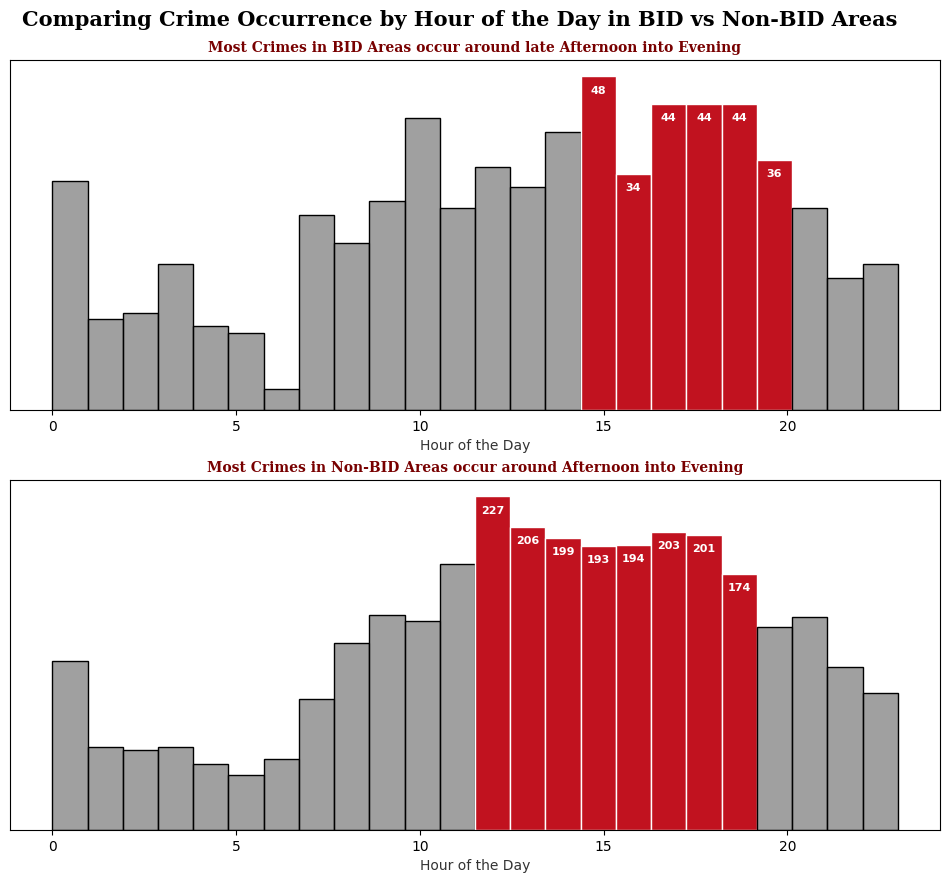

In [70]:
bid_data = cleaned_df[cleaned_df["BID_Status"] == "BID"]
non_bid_data = cleaned_df[cleaned_df["BID_Status"] == "Non-BID"]

fig, (ax1, ax2) = plt.subplots(ncols=1, nrows=2, figsize=(12, 10))
fig.suptitle(
    "Comparing Crime Occurrence by Hour of the Day in BID vs Non-BID Areas",
    fontsize=15,
    fontweight="bold",
    fontfamily="serif",
    y = 0.93
)

def plotter(ax, data, title, min, max):
    sns.histplot(
        data=data,
        x="Start_Hour",
        bins=24,
        color="gray",
        ax=ax,
    )
    ax.set_title(
        title,
        fontsize=10,
        fontweight="bold",
        fontfamily="serif",
        color="#780000",
    )
    ax.yaxis.set_visible(False)
    ax.set_xlabel("Hour of the Day", fontsize=10, color="#333")
    for i, p in enumerate(ax.patches):
        if i > min and i < max:
            p.set_facecolor("#c1121f")
            p.set_edgecolor("#ffffff")
            ax.annotate(
                f"{p.get_height()}", (p.get_x() + p.get_width() / 2.0, p.get_height()),
                ha="center",
                va="center",
                xytext=(0, -10),
                textcoords="offset points",
                fontsize=8,
                color="white",
                fontweight="bold",
            )


plotter(ax1, bid_data, "Most Crimes in BID Areas occur around late Afternoon into Evening", 14, 21)
plotter(
    ax2,
    non_bid_data,
    "Most Crimes in Non-BID Areas occur around Afternoon into Evening",
    11,
    20,
)

2. Temporal Crime Patterns in BID vs Non-BID Areas
Insight: Crime patterns vary significantly between BID and Non-BID areas throughout the day. Non-BID areas experience a sharp spike in crimes at noon, whereas BID areas see a more consistent distribution with a peak in late afternoon and evening.

Implication: The concentration of crimes in Non-BID areas during midday suggests a need for increased law enforcement presence during these hours. In contrast, BID areas may benefit from targeted evening patrols to address late-afternoon crime peaks.

- Crime levels remain low between midnight and 6 AM in both BID and Non-BID areas.
- Non-BID areas experience a sharp spike around noon, suggesting increased daytime crimes.
- BID areas, in contrast, see a gradual increase, peaking around 3 PM - 6 PM, potentially influenced by commercial activity

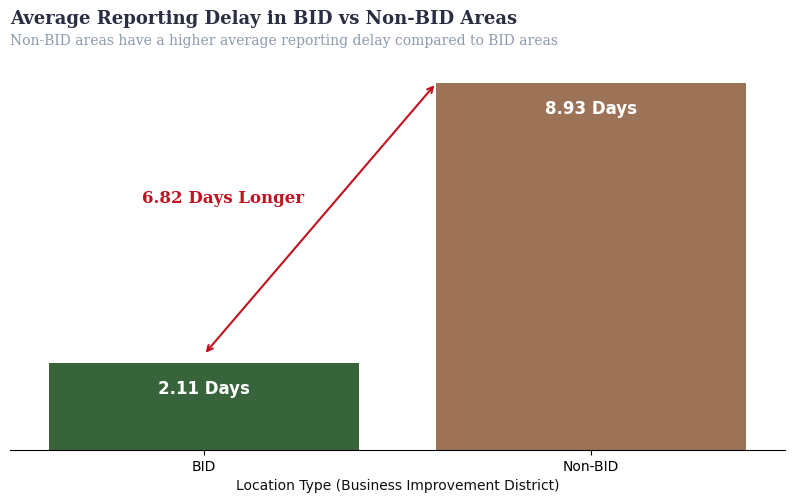

In [71]:
# Compute average reporting delay
temp_df = (
    cleaned_df.groupby("BID_Status").agg({"Report_Delay_Days": "mean"}).reset_index()
)

# Initialize figure
fig, ax = plt.subplots(figsize=(10, 5))

# Bar plot
bars = sns.barplot(
    x=temp_df["BID_Status"],
    y=temp_df["Report_Delay_Days"],
    palette=["#306B34", "#A9714B"],
    ax=ax,
)

# Title & Label Styling
ax.text(
    -0.5,
    ax.get_ylim()[1] + 1,
    "Average Reporting Delay in BID vs Non-BID Areas",
    fontsize=13,
    fontweight="bold",
    fontfamily="serif",
    color="#2B2D42",
)
ax.text(
    -0.5,
    ax.get_ylim()[1] + 0.5,
    "Non-BID areas have a higher average reporting delay compared to BID areas",
    fontsize=10,
    fontweight="light",
    fontfamily="serif",
    color="#8D99AE",
)
ax.set_xlabel(
    "Location Type (Business Improvement District)", fontsize=10, color="#0f0f0f"
)
ax.yaxis.set_visible(False)
ax.spines[["top", "right", "left"]].set_visible(False)

# Add gridlines for better readability
ax.grid(axis="y", linestyle="--", alpha=0.5)

# Add data labels above the bars
for p in bars.patches:
    ax.annotate(
        f"{p.get_height():.2f} Days",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        xytext=(0, -25),
        textcoords="offset points",
        fontsize=12,
        color="white",
        fontweight="bold",
    )

# **Arrow Annotation (Emphasizing 6.82 Day Difference)**
x1, y1 = bars.patches[1].get_x(), bars.patches[1].get_height()  # Non-BID
x2, y2 = (
    bars.patches[0].get_x() + bars.patches[0].get_width() / 2,
    bars.patches[0].get_height(),
)  # BID

ax.annotate(
    "",
    xy=(x1, y1),
    xytext=(x2, y2 + 0.2),
    arrowprops=dict(arrowstyle="<->", color="#c1121f", linewidth=1.5),
)

# Add difference label near the arrow
ax.text(
    x2 + 0.05,
    (y1 + y2) / 2 + 0.5,
    f"{y1 - y2:.2f} Days Longer",
    fontsize=12,
    fontweight="bold",
    fontfamily="serif",
    color="#c1121f",
    ha="center",
)

plt.show()

3. Reporting Delays in BID vs Non-BID Areas
Insight: Non-BID areas experience a longer average reporting delay of 8.93 days, compared to 6.82 days in BID areas. This indicates that crimes in Non-BID areas are reported 2.11 days later on average.

Implication: The delayed reporting in Non-BID areas may hinder timely law enforcement responses, potentially allowing criminal activities to escalate. Streamlining reporting mechanisms and increasing community engagement in these areas could improve response times.

- Crime reporting in Non-BID areas is significantly slower, with an average delay of 8.93 days, compared to just 2.11 days in BID areas.
- This 6.82-day difference suggests that structured management in BID areas improves reporting efficiency

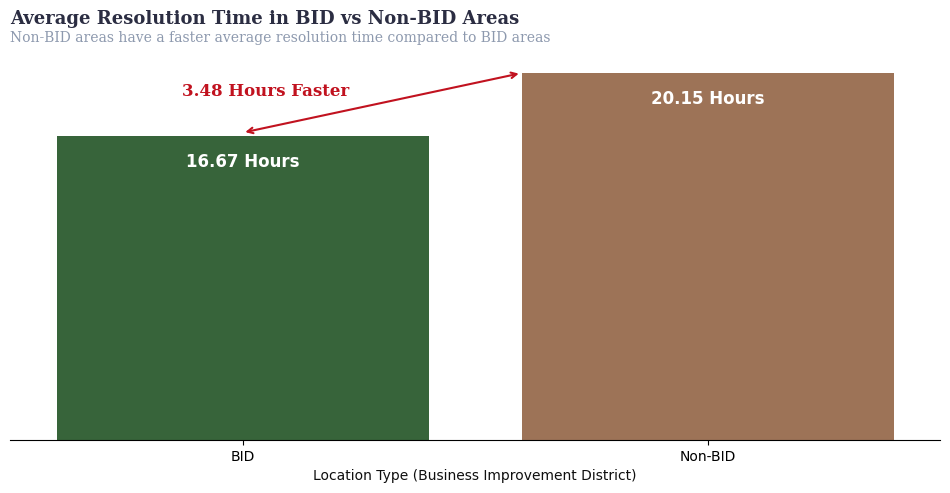

In [72]:
# Ensure date columns are in datetime format
cleaned_df["START_DATE"] = pd.to_datetime(cleaned_df["START_DATE"])
cleaned_df["END_DATE"] = pd.to_datetime(cleaned_df["END_DATE"])

# Calculate resolution time in hours
cleaned_df["Resolution_Time"] = (
    cleaned_df["END_DATE"] - cleaned_df["START_DATE"]
).dt.total_seconds() / 3600

# Compute average resolution time by BID status
temp_df = (
    cleaned_df.groupby("BID_Status").agg({"Resolution_Time": "mean"}).reset_index()
)

# Initialize figure
fig, ax = plt.subplots(figsize=(12, 5))

# Bar plot
bars = sns.barplot(
    x=temp_df["BID_Status"],
    y=temp_df["Resolution_Time"],
    palette=["#306b34", "#A9714B"],
    ax=ax,
)

# Title & Labels
ax.text(
    -0.5,
    ax.get_ylim()[1] + 1.7,
    "Average Resolution Time in BID vs Non-BID Areas",
    fontsize=13,
    fontweight="bold",
    fontfamily="serif",
    color="#2B2D42",
)
ax.text(
    -0.5,
    ax.get_ylim()[1] + 0.7,
    "Non-BID areas have a faster average resolution time compared to BID areas",
    fontsize=10,
    fontweight="light",
    fontfamily="serif",
    color="#8D99AE",
)
ax.set_xlabel(
    "Location Type (Business Improvement District)", fontsize=10, color="#0f0f0f"
)
ax.yaxis.set_visible(False)
ax.spines[["top", "right", "left"]].set_visible(False)

# Add subtle gridlines for better readability
ax.grid(axis="y", linestyle="--", alpha=0.5)

# Add data labels above bars
for p in bars.patches:
    ax.annotate(
        f"{p.get_height():.2f} Hours",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        xytext=(0, -25),
        textcoords="offset points",
        fontsize=12,
        color="white",
        fontweight="bold",
    )

# **Arrow Annotation (Highlighting 3.48-Hour Difference)**
x1, y1 = bars.patches[1].get_x(), bars.patches[1].get_height()  # Non-BID
x2, y2 = (
    bars.patches[0].get_x() + bars.patches[0].get_width() / 2,
    bars.patches[0].get_height(),
)  # BID

ax.annotate(
    "",
    xy=(x1, y1),
    xytext=(x2, y2 + 0.2),
    arrowprops=dict(arrowstyle="<->", color="#c1121f", linewidth=1.5),
)

# Add difference label near the arrow
ax.text(
    x2 + 0.05,
    (y1 + y2) / 2 + 0.5,
    f"{y1 - y2:.2f} Hours Faster",
    fontsize=12,
    fontweight="bold",
    fontfamily="serif",
    color="#c1121f",
    ha="center",
)

plt.show()

Insight: Despite higher reporting delays, Non-BID areas have a faster average resolution time of 16.67 hours, compared to 20.15 hours in BID areas. This suggests that crimes in Non-BID areas are resolved 3.48 hours faster.

Implication: The faster resolution in Non-BID areas may reflect prioritization by law enforcement due to higher crime volumes. However, the longer resolution times in BID areas could indicate more complex cases or stricter enforcement protocols.

- Crimes in BID areas are resolved 3.48 hours faster than in Non-BID areas, with an average resolution time of 16.67 hours vs. 20.15 hours.
- This suggests that BID areas may benefit from better management, faster response teams, or more efficient policing.

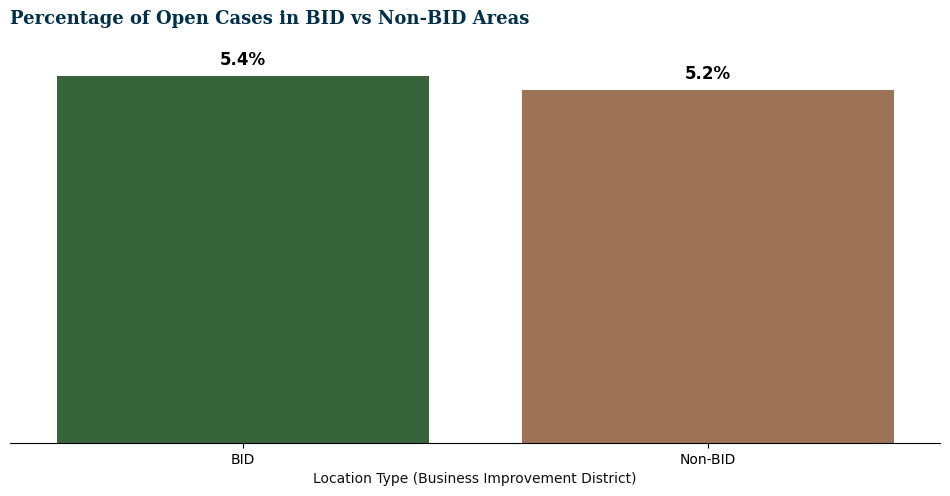

In [73]:
# Aggregate total crimes and open cases
crime_counts = cleaned_df.groupby("BID_Status").size().reset_index(name="Total_Crimes")
open_cases = (
    cleaned_df.groupby("BID_Status")["Ongoing_Crime_Flag"]
    .sum()
    .reset_index(name="Open_Cases")
)

# Merge and calculate the percentage of open cases
temp_df = open_cases.merge(crime_counts, on="BID_Status")
temp_df["Open_Case_Percentage"] = (
    temp_df["Open_Cases"] / temp_df["Total_Crimes"]
) * 100

# Plot
fig, ax = plt.subplots(figsize=(12, 5))
bars = sns.barplot(
    x=temp_df["BID_Status"],
    y=temp_df["Open_Case_Percentage"],
    palette=["#306b34", "#a9714b"],
    ax=ax,
)

# Titles & Labels
ax.text(
    -0.5,
    ax.get_ylim()[1] + 0.5,
    "Percentage of Open Cases in BID vs Non-BID Areas",
    fontsize=13,
    fontweight="bold",
    fontfamily="serif",
    color="#003049",
)
ax.set_xlabel(
    "Location Type (Business Improvement District)", fontsize=10, color="#0f0f0f"
)
ax.yaxis.set_visible(False)
ax.spines[["top", "right", "left"]].set_visible(False)
ax.grid(axis="y", linestyle="--", alpha=0.5)

# Add data labels above bars
for p in bars.patches:
    ax.annotate(
        f"{p.get_height():.1f}%",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        xytext=(0, 5),
        textcoords="offset points",
        fontsize=12,
        color="black",
        fontweight="bold",
    )
plt.show()

- Non-BID areas have 4.5 times more open cases than BID areas (165 vs. 37).
- This suggests that crime investigations in BID areas may be resolved faster or better managed compared to Non-BID areas.
- Further investigation could explore why cases remain open longer in Non-BID areas—whether due to lack of resources, inefficiencies, or more complex crimes.

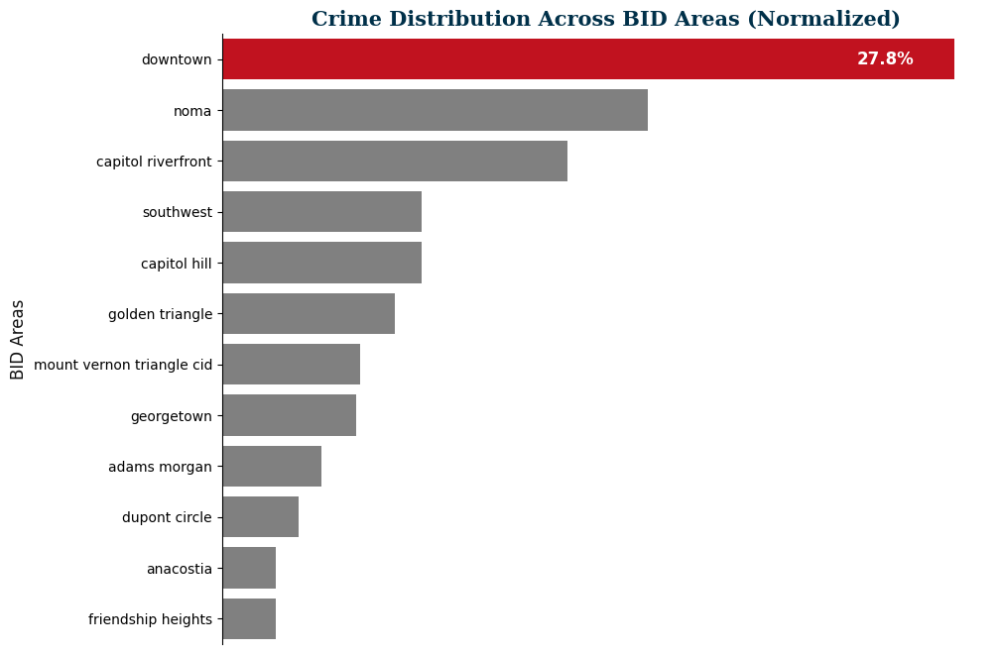

In [74]:
fig, ax = plt.subplots(figsize=(10, 8))

# Count crimes per BID and normalize to percentage
bid_counts = bid_data["BID"].value_counts()
bid_percentages = (bid_counts / bid_counts.sum()) * 100

# Create the count plot with percentages
sns.barplot(
    x=bid_percentages.values,
    y=bid_percentages.index,
    ax=ax,
)

# Highlight the BID with the highest crime percentage
highest_bid = ax.patches[0]  # First bar (highest percentage)
highest_bid.set_facecolor("#c1121f")  # Change color

# Add percentage labels inside the bars
ax.annotate(
    f"{highest_bid.get_width():.1f}%",
    (highest_bid.get_width(), highest_bid.get_y() + highest_bid.get_height() / 2),
    ha="center",
    va="center",
    xytext=(-50, 0),  # Adjust label position
    textcoords="offset points",
    fontsize=12,
    color="white",
    fontweight="bold",
)

# Improve aesthetics
ax.set_title(
    "Crime Distribution Across BID Areas (Normalized)",
    fontsize=15,
    fontweight="bold",
    fontfamily="serif",
    color="#003049",
)
ax.set_xlabel("Percentage of Total Crimes in BID Areas", fontsize=12, color="#0f0f0f")
ax.set_ylabel("BID Areas", fontsize=12, color="#0f0f0f")
ax.xaxis.set_visible(False)  # Hide x-axis for clarity
ax.spines[["top", "right", "bottom"]].set_visible(False)  # Clean up frame

plt.show()

. Crime Distribution Across BID Areas
Insight: The Downtown area accounts for 27.8% of crimes in BID areas, making it the most crime-prone BID location. Other significant areas include NoMa and Capitol Riverfront.

Implication: Downtown's high crime concentration may be due to its high foot traffic and commercial activity. Targeted interventions, such as increased surveillance and community policing, could help reduce crime in this area.

In [75]:
# Group by BID
bid_summary = (
    cleaned_df.groupby("BID")
    .agg(
        Most_Reported_Crime=("OFFENSE", lambda x: x.mode()[0]),  # Most common crime
        Hottest_Hour=(
            "Start_Hour",
            lambda x: x.value_counts().idxmax(),
        ),  # Most frequent crime hour
        Avg_Resolution_Time=("Resolution_Time", "mean"),  # Avg resolution time
        Open_Case_Percentage=(
            "Ongoing_Crime_Flag",
            lambda x: (x.sum() / len(x)) * 100,
        ),  # % Open Cases
        Total_Crimes=("BID", "count"),  # Total crimes in the BID
        Avg_Report_Delay=("Report_Delay_Days", "mean"),  # Avg reporting delay
    )
    .reset_index()
)

# Style the table
styled_table = (
    bid_summary.style.format(
        {
            "Avg_Resolution_Time": "{:.2f} hrs",
            "Open_Case_Percentage": "{:.1f}%",
            "Avg_Report_Delay": "{:.2f} days",
        }
    )
    .set_caption("🚔 Crime Analysis by BID Area")
    .set_properties(**{"text-align": "center", "border": "1px solid black"})
    .set_table_styles(
        [
            {
                "selector": "th",
                "props": [
                    ("background-color", "#8D99AE"),
                    ("color", "#2B2D42"),
                    ("font-size", "12px"),
                ],
            },
            {
                "selector": "td",
                "props": [("border", "1px solid #f0f0f0"), ("padding", "6px")],
            },
        ]
    )
    .bar(subset=["Open_Case_Percentage"], cmap="Reds")  # Red color for high open case %
    .bar(subset=["Total_Crimes"], cmap="Blues")  # Blue color for total crime count
)

styled_table

,BID,Most_Reported_Crime,Hottest_Hour,Avg_Resolution_Time,Open_Case_Percentage,Total_Crimes,Avg_Report_Delay
0,adams morgan,theft/other,20,10.55 hrs,3.8%,26,1.92 days
1,anacostia,theft/other,19,4.41 hrs,7.1%,14,6.00 days
2,capitol hill,theft/other,17,18.24 hrs,3.8%,52,2.67 days
3,capitol riverfront,motor vehicle theft,19,12.98 hrs,6.7%,90,1.60 days
4,downtown,theft/other,10,14.81 hrs,5.2%,191,1.81 days
5,dupont circle,theft/other,10,6.88 hrs,5.0%,20,0.90 days
6,friendship heights,theft f/auto,12,11.78 hrs,0.0%,14,4.79 days
7,georgetown,theft/other,17,1.84 hrs,5.7%,35,0.40 days
8,golden triangle,theft/other,13,3.52 hrs,8.9%,45,0.73 days
9,mount vernon triangle cid,theft/other,18,55.09 hrs,5.6%,36,2.53 days



3. Most Reported Crimes
Insight: Theft/other is the most reported crime across almost all BID areas, with the exception of Capitol Riverfront, where motor vehicle theft is more prevalent.

Implication: Theft-related crimes are a significant issue in BID areas. Implementing theft prevention measures, such as better lighting, security cameras, and public awareness campaigns, could help mitigate this trend.

4. Peak Crime Hours
Insight: Crime peaks during late afternoon and evening hours in most BID areas. For example:

Adams Morgan and Georgetown see peak crimes at 8 PM.

Capitol Hill and Capitol Riverfront experience peak crimes at 5 PM and 7 PM, respectively.

Implication: Law enforcement should focus on increasing patrols during these peak hours to deter criminal activities.

5. Average Resolution Time
Insight: Resolution times vary significantly across BID areas:

Georgetown has the fastest resolution time at 1.84 hours, while Mount Vernon Triangle CID has the slowest at 55.09 hours.

Implication: The disparity in resolution times may reflect differences in resource allocation or case complexity. Areas with slower resolution times, like Mount Vernon Triangle CID, may require additional resources or streamlined processes.

6. Reporting Delays
Insight: Reporting delays range from 0.40 days (Georgetown) to 6.00 days (Anacostia). Longer delays in areas like Anacostia could hinder timely law enforcement responses.

Implication: Efforts to reduce reporting delays, such as community outreach and accessible reporting tools, could improve response times in areas with longer delays.

7. Total Crimes by BID Area
Insight: Downtown has the highest number of crimes (191), followed by NoMa (111) and Capitol Riverfront (90). In contrast, Friendship Heights has the lowest number of crimes (14).

Implication: High-crime areas like Downtown and NoMa may benefit from targeted crime prevention strategies, while low-crime areas like Friendship Heights could serve as models for successful safety initiatives.

8. Open Case Percentage by BID Area
Insight: Golden Triangle has the highest percentage of open cases (8.9%), while Friendship Heights has no open cases (0%).

Implication: Golden Triangle may require additional resources or improved processes to resolve cases more efficiently.

9. Crime Hotspots
Insight: The Downtown area is a clear hotspot, contributing to over a quarter of all crimes in BID areas. Other notable hotspots include NoMa and Capitol Riverfront.

Implication: Hotspots should be prioritized for resource allocation, such as increased police presence, community programs, and infrastructure improvements.

10. Theft from Auto in Friendship Heights
Insight: Friendship Heights stands out with theft from auto as the most reported crime, peaking at 12 PM.

Implication: This area may benefit from targeted measures to prevent auto theft, such as improved parking security and public awareness campaigns.

In [76]:
temp_df = cleaned_df.copy()
temp_df.rename(columns={"BID": "BID Area", "Start_Hour": "Hour"}, inplace=True)
# Define the magnify function
def magnify():
    return [
        {
            "selector": "th",
            "props": [
                ("font-size", "10pt"),
                ("text-align", "center"),
                ("background", "#2B2D42"),
                ("color", "white"),
            ],
        },
        {"selector": "td:hover", "props": [("font-size", "12pt")]},  # Magnify effect
    ]


# Create a crime count pivot table (BIDs x Hours)
hourly_crime_df = temp_df.pivot_table(
    index="BID Area", columns="Hour", aggfunc="size", fill_value=0
)

# Normalize by row (percentage per BID)
hourly_crime_pct = hourly_crime_df.div(hourly_crime_df.sum(axis=1), axis=0) * 100

# Apply white-to-red gradient
cmap = sns.light_palette("#c1121f", as_cmap=True)  # Lightest (white) to darkest (red)
styled_table = (
    hourly_crime_pct.style.background_gradient(cmap, axis=1)  # Apply heatmap effect
    .set_properties(**{"max-width": "80px", "font-size": "1pt"})  # Optimize readability
    .set_caption("🚔 Crime Distribution Across Hours by BID (Hover to magnify)")
    .format("{:.1f}%")  # Show 1 decimal for percentages
    .set_table_styles(magnify())
)

styled_table

Hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
BID Area,,,,,,,,,,,,,,,,,,,,,,,,
adams morgan,3.8%,3.8%,3.8%,11.5%,0.0%,3.8%,0.0%,3.8%,0.0%,3.8%,0.0%,0.0%,3.8%,7.7%,0.0%,7.7%,3.8%,3.8%,0.0%,7.7%,19.2%,3.8%,3.8%,3.8%
anacostia,7.1%,0.0%,0.0%,7.1%,7.1%,7.1%,0.0%,7.1%,7.1%,0.0%,7.1%,0.0%,0.0%,0.0%,7.1%,0.0%,7.1%,7.1%,0.0%,14.3%,0.0%,0.0%,14.3%,0.0%
capitol hill,7.7%,0.0%,0.0%,3.8%,1.9%,1.9%,1.9%,3.8%,3.8%,5.8%,3.8%,3.8%,7.7%,5.8%,1.9%,5.8%,9.6%,11.5%,5.8%,9.6%,1.9%,1.9%,0.0%,0.0%
capitol riverfront,3.3%,1.1%,1.1%,1.1%,1.1%,2.2%,0.0%,4.4%,3.3%,3.3%,2.2%,4.4%,7.8%,6.7%,4.4%,2.2%,7.8%,4.4%,7.8%,12.2%,10.0%,4.4%,2.2%,2.2%
downtown,5.2%,1.6%,2.1%,2.1%,1.6%,2.1%,0.0%,5.8%,4.7%,4.7%,8.4%,6.3%,3.1%,4.7%,6.3%,8.4%,4.7%,2.6%,7.9%,5.8%,5.2%,2.6%,1.0%,3.1%
dupont circle,10.0%,0.0%,0.0%,0.0%,5.0%,0.0%,0.0%,5.0%,10.0%,5.0%,15.0%,10.0%,5.0%,5.0%,10.0%,10.0%,0.0%,0.0%,0.0%,5.0%,0.0%,5.0%,0.0%,0.0%
friendship heights,7.1%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,7.1%,7.1%,14.3%,21.4%,0.0%,7.1%,14.3%,7.1%,7.1%,0.0%,0.0%,0.0%,0.0%,7.1%,0.0%
georgetown,0.0%,2.9%,0.0%,2.9%,0.0%,0.0%,0.0%,0.0%,2.9%,2.9%,8.6%,5.7%,11.4%,5.7%,8.6%,8.6%,2.9%,20.0%,8.6%,2.9%,0.0%,0.0%,2.9%,2.9%
golden triangle,4.4%,2.2%,8.9%,4.4%,6.7%,2.2%,0.0%,6.7%,0.0%,2.2%,2.2%,0.0%,4.4%,11.1%,0.0%,4.4%,4.4%,8.9%,2.2%,2.2%,6.7%,4.4%,4.4%,6.7%


Here are the **insights** derived from the crime distribution across hours by BID areas:

---

### **1. Temporal Crime Patterns**
- **Insight:** Crime distribution varies significantly across different hours of the day in each BID area. For example:
  - **Adams Morgan:** Crimes peak at **8 PM (19.2%)**, with a secondary peak at **3 AM (11.5%)**.
  - **Capitol Hill:** Crimes are most frequent at **5 PM (11.5%)** and **7 PM (9.6%)**.
  - **Capitol Riverfront:** Crimes peak at **7 PM (12.2%)** and **8 PM (10.0%)**.
  - **Downtown:** Crimes are spread throughout the day, with a slight peak at **10 AM (8.4%)** and **3 PM (8.4%)**.
  - **Georgetown:** Crimes peak at **5 PM (20.0%)**, indicating a strong evening trend.
  - **Mount Vernon Triangle CID:** Crimes peak at **6 PM (16.7%)** and **5 PM (11.1%)**.

- **Implication:** Law enforcement should focus on peak hours in each area to allocate resources effectively. For example, evening patrols should be prioritized in areas like Georgetown and Capitol Riverfront, while Downtown requires consistent coverage throughout the day.

---

### **2. High-Crime Hours**
- **Insight:** Certain hours are consistently high-crime across multiple BID areas:
  - **5 PM (17:00):** Peaks in **Georgetown (20.0%)**, **Capitol Hill (11.5%)**, and **Mount Vernon Triangle CID (11.1%)**.
  - **7 PM (19:00):** Peaks in **Capitol Riverfront (12.2%)** and **Adams Morgan (7.7%)**.
  - **10 AM (10:00):** Peaks in **Downtown (8.4%)** and **Dupont Circle (15.0%)**.

- **Implication:** These hours represent critical times for targeted policing and community safety initiatives. Public awareness campaigns can also be timed to coincide with these high-crime periods.

---

### **3. Low-Crime Hours**
- **Insight:** Early morning hours (e.g., **2 AM to 6 AM**) generally have lower crime rates across most BID areas. For example:
  - **Friendship Heights:** No crimes reported between **2 AM and 6 AM**.
  - **Georgetown:** No crimes reported at **2 AM, 4 AM, 5 AM, and 6 AM**.
  - **Mount Vernon Triangle CID:** No crimes reported at **3 AM and 5 AM**.

- **Implication:** Resources can be reallocated from low-crime hours to high-crime hours to optimize law enforcement efficiency.

---

### **4. Unique Trends in Specific BID Areas**
- **Insight:** Some BID areas exhibit unique crime patterns:
  - **Dupont Circle:** Crimes peak at **10 AM (15.0%)** and **3 PM (10.0%)**, indicating a focus on daytime activities.
  - **Friendship Heights:** Crimes peak at **12 PM (21.4%)**, suggesting a midday hotspot.
  - **Golden Triangle:** Crimes are spread across the day, with slight peaks at **2 AM (8.9%)** and **5 PM (8.9%)**.
  - **Noma:** Crimes peak at **9 PM (9.0%)** and **10 PM (7.2%)**, indicating a late-evening trend.

- **Implication:** Each BID area requires tailored strategies based on its unique crime patterns. For example, Friendship Heights may benefit from increased midday patrols, while Noma may require more evening coverage.

---

### **5. Consistency in Crime Types**
- **Insight:** Theft-related crimes (e.g., theft/other, theft from auto) are the most common across all BID areas, with peaks during specific hours.
- **Implication:** Theft prevention measures, such as improved lighting, surveillance, and public awareness campaigns, should be prioritized in high-crime hours and areas.

---

### **6. Open Case Percentages**
- **Insight:** Open case percentages vary across BID areas, with **Golden Triangle** having the highest percentage (8.9%) and **Friendship Heights** having no open cases (0%).
- **Implication:** Areas with higher open case percentages, like Golden Triangle, may require additional resources or improved processes to resolve cases more efficiently.

---

### **Recommendations**
1. **Targeted Policing:** Focus on peak crime hours in each BID area to maximize resource efficiency.
2. **Theft Prevention:** Implement theft prevention measures during high-crime hours, such as increased surveillance and public awareness campaigns.
3. **Resource Allocation:** Reallocate resources from low-crime hours (e.g., early morning) to high-crime hours (e.g., evening) in areas like Georgetown and Capitol Riverfront.
4. **Tailored Strategies:** Develop area-specific strategies based on unique crime patterns, such as midday patrols in Friendship Heights and late-evening coverage in Noma.
5. **Case Resolution:** Allocate additional resources to areas with higher open case percentages, like Golden Triangle, to improve resolution rates.

---

These insights can be visualized using **Tableau dashboards** and presented to stakeholders in a **PowerPoint presentation** for actionable decision-making. Let me know if you'd like help creating these deliverables! 😊

### Districts

In [77]:
geojson_path = "../map/police-districts-mpd.geojson"  # Adjust the file path
dc_map = gpd.read_file(geojson_path)

In [78]:
# Convert float DISTRICT to integer,
cleaned_df["DISTRICT"] = cleaned_df["DISTRICT"].astype(float).astype(int)
# Group crime data by Ward
crime_by_district = (
    cleaned_df.groupby("DISTRICT").size().reset_index(name="Crime_Count")
)

# Merge the crime data with the GeoJSON map
merged_data = dc_map.merge(crime_by_district, left_on="DISTRICT", right_on="DISTRICT")
centroid = merged_data.geometry.centroid
m = folium.Map(
    location=[centroid.y.mean(), centroid.x.mean()],
    zoom_start=12,
    zoom_control=False,
    tiles="Cartodb Positron",
)

In [79]:
# Add a choropleth layer
folium.Choropleth(
    geo_data=geojson_path,
    data=crime_by_district,
    columns=["DISTRICT", "Crime_Count"],
    key_on="feature.properties.DISTRICT",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.4,  # Slightly stronger border for clarity
    legend_name="Crime Rate per District",
).add_to(m)

# Add district name labels at their centroids
for _, row in merged_data.iterrows():
    folium.Marker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],
        icon=folium.DivIcon(
            html=f'<div style="font-size:10pt; color:black; font-weight:bold; background:white; padding:2px; border-radius:5px;">{row["DISTRICT"]}</div>'
        ),
    ).add_to(m)

# Add interactive tooltips
folium.GeoJson(
    merged_data,
    tooltip=folium.GeoJsonTooltip(
        fields=["DISTRICT", "Crime_Count"],
        aliases=["District: ", "Crime Frequency: "],
        localize=True,
        sticky=True,
        labels=True,
        style="background-color: white; color: black; font-size: 12px; padding:5px;",
    ),
).add_to(m)

m

In [80]:
# Group by district to calculate key metrics
district_summary = (
    cleaned_df.groupby("DISTRICT")
    .agg(
        Most_Reported_Crime=("OFFENSE", lambda x: x.mode()[0]),
        Hottest_Hour=("Start_Hour", lambda x: x.value_counts().idxmax()),
        Avg_Resolution_Time=("Resolution_Time", "mean"),
        Open_Case_Percentage=(
            "Ongoing_Crime_Flag",
            lambda x: (x.sum() / x.count()) * 100,
        ),
        Avg_Reporting_Delay=("Report_Delay_Days", "mean"),
    )
    .reset_index()
)

# Style the table with a white-to-red gradient
cmap = sns.light_palette("#c1121f", as_cmap=True)

styled_table = (
    district_summary.style.background_gradient(
        cmap,
        subset=["Avg_Resolution_Time", "Open_Case_Percentage", "Avg_Reporting_Delay"],
    )
    .format(
        {
            "Avg_Resolution_Time": "{:.2f} Hours",
            "Open_Case_Percentage": "{:.2f}%",
            "Avg_Reporting_Delay": "{:.2f} Days",
        }
    )
    .set_caption("District-Level Crime Insights")
)

styled_table

,DISTRICT,Most_Reported_Crime,Hottest_Hour,Avg_Resolution_Time,Open_Case_Percentage,Avg_Reporting_Delay
0,1,theft/other,18,16.25 Hours,4.96%,2.55 Days
1,2,theft/other,12,22.17 Hours,3.37%,2.67 Days
2,3,theft/other,15,15.28 Hours,6.62%,2.08 Days
3,4,theft/other,13,15.06 Hours,3.77%,1.97 Days
4,5,theft/other,21,18.17 Hours,4.48%,2.25 Days
5,6,motor vehicle theft,12,29.54 Hours,7.41%,2.23 Days
6,7,theft/other,17,28.21 Hours,8.65%,75.03 Days


Here are the **insights** derived from the district-level crime data:

---

### **1. Most Reported Crime**
- **Insight:** Theft/other is the **most reported crime** across all districts except **District 6**, where motor vehicle theft is the most common.
- **Implication:** Theft prevention measures, such as increased surveillance and public awareness campaigns, should be prioritized in all districts, with a specific focus on motor vehicle theft in District 6.

---

### **2. Hottest Hours**
- **Insight:** Crime peaks at different hours across districts:
  - **District 1:** 6 PM (18:00)
  - **District 2:** 12 PM (12:00)
  - **District 3:** 3 PM (15:00)
  - **District 4:** 1 PM (13:00)
  - **District 5:** 9 PM (21:00)
  - **District 6:** 12 PM (12:00)
  - **District 7:** 5 PM (17:00)
- **Implication:** Law enforcement should focus on these peak hours in each district to allocate resources effectively and deter criminal activities.

---

### **3. Average Resolution Time**
- **Insight:** Resolution times vary significantly across districts:
  - **District 6** has the longest average resolution time at **29.54 hours**, followed by **District 7** at **28.21 hours**.
  - **District 4** has the shortest average resolution time at **15.06 hours**.
- **Implication:** Districts with longer resolution times, such as District 6 and District 7, may require additional resources or improved processes to resolve cases more efficiently.

---

### **4. Open Case Percentage**
- **Insight:** The percentage of open cases varies across districts:
  - **District 7** has the highest open case percentage at **8.65%**, followed by **District 3** at **6.62%**.
  - **District 2** has the lowest open case percentage at **3.37%**.
- **Implication:** Districts with higher open case percentages, such as District 7 and District 3, may need additional support to close cases more effectively.

---

### **5. Average Reporting Delay**
- **Insight:** Reporting delays vary across districts:
  - **District 7** has an exceptionally high average reporting delay of **75.03 days**, indicating significant delays in reporting crimes.
  - **District 4** has the shortest average reporting delay at **1.97 days**.
- **Implication:** Efforts to reduce reporting delays, such as community outreach and accessible reporting tools, should be prioritized in District 7 to improve response times and case resolution.

---

### **Key Recommendations**
1. **Targeted Policing:** Focus on peak crime hours in each district to maximize resource efficiency.
2. **Theft Prevention:** Implement theft prevention measures, such as security cameras and public awareness campaigns, across all districts, with a specific focus on motor vehicle theft in District 6.
3. **Resource Allocation:** Allocate additional resources to districts with longer resolution times (e.g., District 6 and District 7) and higher open case percentages (e.g., District 7 and District 3) to improve case resolution rates.
4. **Community Engagement:** Launch public awareness campaigns to educate residents about crime prevention strategies and encourage timely reporting of crimes, especially in District 7.
5. **Tailored Strategies:** Develop district-specific strategies based on unique crime patterns, such as increased patrols during peak hours and targeted interventions for high-crime areas.

---

These insights can be visualized using **Tableau dashboards** and presented to stakeholders in a **PowerPoint presentation** for actionable decision-making. Let me know if you'd like help creating these deliverables! 😊

In [81]:
temp_df = cleaned_df.copy()
temp_df.rename(columns={"DISTRICT": "District", "Start_Hour": "Hour"}, inplace=True)


# Define the magnify function
def magnify():
    return [
        {
            "selector": "th",
            "props": [
                ("font-size", "10pt"),
                ("text-align", "center"),
                ("background", "#2B2D42"),
                ("color", "white"),
            ],
        },
        {"selector": "td:hover", "props": [("font-size", "12pt")]},  # Magnify effect
    ]


# Create a crime count pivot table (BIDs x Hours)
hourly_crime_df = temp_df.pivot_table(
    index="District", columns="Hour", aggfunc="size", fill_value=0
)

# Normalize by row (percentage per BID)
hourly_crime_pct = hourly_crime_df.div(hourly_crime_df.sum(axis=1), axis=0) * 100

# Apply white-to-red gradient
cmap = sns.light_palette("#c1121f", as_cmap=True)  # Lightest (white) to darkest (red)
styled_table = (
    hourly_crime_pct.style.background_gradient(cmap, axis=1)  # Apply heatmap effect
    .set_properties(**{"max-width": "80px", "font-size": "1pt"})  # Optimize readability
    .set_caption("🚔 Crime Distribution Across Hours by District (Hover to magnify)")
    .format("{:.1f}%")  # Show 1 decimal for percentages
    .set_table_styles(magnify())
)

styled_table

Hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
District,,,,,,,,,,,,,,,,,,,,,,,,
1,3.7%,1.5%,1.7%,1.9%,1.3%,1.3%,0.9%,2.4%,3.0%,3.9%,4.5%,6.2%,7.1%,5.2%,5.8%,5.8%,6.7%,5.8%,8.2%,7.3%,4.5%,4.7%,3.4%,3.0%
2,3.2%,0.8%,2.0%,2.0%,1.2%,1.2%,0.6%,4.4%,4.3%,6.0%,6.7%,6.3%,8.3%,6.9%,7.1%,7.4%,5.4%,6.7%,6.1%,4.9%,3.5%,1.7%,1.4%,1.8%
3,3.0%,2.6%,2.0%,2.1%,1.2%,1.2%,0.8%,2.0%,3.3%,5.3%,4.7%,7.1%,6.3%,5.4%,6.9%,7.4%,4.2%,5.7%,6.3%,5.6%,5.0%,4.4%,4.1%,3.8%
4,4.6%,1.1%,1.5%,1.6%,1.8%,1.8%,2.3%,2.5%,4.4%,3.8%,4.3%,4.8%,7.9%,8.7%,5.9%,5.1%,6.7%,6.2%,6.2%,5.7%,3.6%,4.3%,2.5%,2.8%
5,4.4%,1.9%,2.0%,2.0%,1.9%,1.2%,1.5%,1.7%,3.6%,3.6%,4.4%,4.6%,4.5%,5.5%,6.4%,7.0%,6.3%,6.9%,4.9%,6.0%,5.8%,7.2%,3.7%,3.1%
6,4.0%,1.7%,2.0%,1.5%,1.5%,0.7%,2.5%,6.2%,4.4%,3.5%,4.7%,3.0%,8.1%,5.2%,5.4%,5.4%,6.2%,4.9%,7.9%,4.7%,4.9%,5.2%,4.0%,2.5%
7,4.2%,3.8%,0.3%,3.1%,1.0%,1.0%,0.7%,3.8%,4.8%,6.6%,3.1%,5.5%,5.9%,5.5%,4.2%,3.1%,6.6%,9.0%,5.9%,4.8%,3.5%,3.1%,6.2%,4.2%


Here are the **insights** derived from the crime distribution across hours by district:

---

### **1. District 1**
- **Insight:** Crimes peak at **6 PM (18:00)** with **8.2%** of incidents, followed by **12 PM (12:00)** at **7.1%**.
- **Implication:** Law enforcement should focus on evening and midday hours, particularly around 6 PM, to deter criminal activities.

---

### **2. District 2**
- **Insight:** Crimes peak at **12 PM (12:00)** with **8.3%** of incidents, followed by **1 PM (13:00)** at **7.1%**.
- **Implication:** Midday patrols and increased surveillance should be prioritized, especially around noon and early afternoon.

---

### **3. District 3**
- **Insight:** Crimes peak at **3 PM (15:00)** with **7.4%** of incidents, followed by **2 PM (14:00)** at **6.9%**.
- **Implication:** Afternoon hours, particularly around 3 PM, require heightened police presence and community safety measures.

---

### **4. District 4**
- **Insight:** Crimes peak at **1 PM (13:00)** with **8.7%** of incidents, followed by **12 PM (12:00)** at **7.9%**.
- **Implication:** Midday hours, especially around 1 PM, should be the focus of law enforcement efforts to reduce crime rates.

---

### **5. District 5**
- **Insight:** Crimes peak at **9 PM (21:00)** with **7.2%** of incidents, followed by **5 PM (17:00)** at **6.9%**.
- **Implication:** Evening and late afternoon hours, particularly around 9 PM, require targeted policing and community engagement.

---

### **6. District 6**
- **Insight:** Crimes peak at **12 PM (12:00)** with **8.1%** of incidents, followed by **6 PM (18:00)** at **7.9%**.
- **Implication:** Midday and evening hours, especially around noon and 6 PM, should be prioritized for crime prevention efforts.

---

### **7. District 7**
- **Insight:** Crimes peak at **5 PM (17:00)** with **9.0%** of incidents, followed by **9 AM (09:00)** at **6.6%**.
- **Implication:** Late afternoon and early morning hours, particularly around 5 PM, require increased police presence and surveillance.

---

### **Key Recommendations**
1. **Targeted Policing:** Focus on peak crime hours in each district to maximize resource efficiency.
2. **Enhanced Surveillance:** Increase surveillance and lighting in high-crime areas during vulnerable hours.
3. **Community Engagement:** Launch public awareness campaigns to educate residents about crime prevention strategies.
4. **Resource Allocation:** Reallocate resources from low-crime hours to high-crime hours to optimize law enforcement efforts.
5. **Tailored Strategies:** Develop district-specific strategies based on unique crime patterns, such as increased patrols during peak hours and targeted interventions for high-crime areas.

---

These insights can be visualized using **Tableau dashboards** and presented to stakeholders in a **PowerPoint presentation** for actionable decision-making. Let me know if you'd like help creating these deliverables! 😊

In [82]:
# Extract unique sector prefixes from the SECTOR column
cleaned_df["Sector_Prefix"] = cleaned_df["SECTOR"].str.extract(
    r"(\d+)"
)  # Extract numeric prefix

# Convert to numeric for comparison
cleaned_df["Sector_Prefix"] = pd.to_numeric(
    cleaned_df["Sector_Prefix"], errors="coerce"
)

# Identify mismatched sectors (where sector prefix doesn't match district)
mismatched_sectors = cleaned_df[cleaned_df["Sector_Prefix"] != cleaned_df["DISTRICT"]]

# Display mismatched records
print(mismatched_sectors[["DISTRICT", "SECTOR"]].drop_duplicates())

      DISTRICT SECTOR
618          5    2D1
1064         5    3D2
1783         5    2D2
2000         5    3D3


In [83]:
# Filter out mismatched sectors
cleaned_df = cleaned_df[cleaned_df["Sector_Prefix"] == cleaned_df["DISTRICT"]]

# Drop the temporary Sector_Prefix column
cleaned_df = cleaned_df.drop(columns=["Sector_Prefix"])

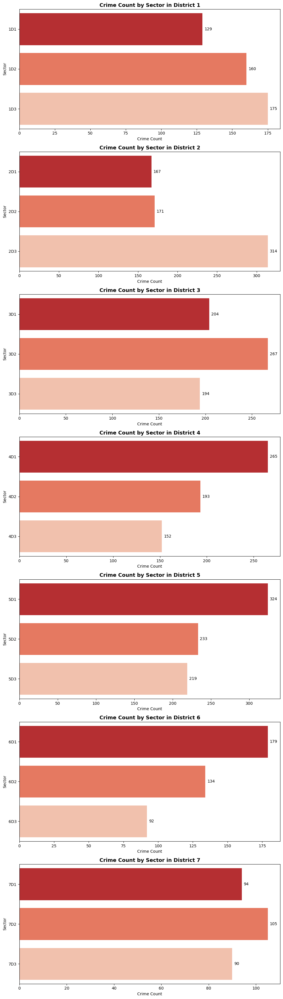

In [84]:
# Aggregate crime count by District and Sector
crime_by_district_sector = (
    cleaned_df.groupby(["DISTRICT", "SECTOR"]).size().reset_index(name="Crime_Count")
)

# Get unique districts
unique_districts = crime_by_district_sector["DISTRICT"].unique()

# Create subplots for each district
fig, axes = plt.subplots(
    nrows=len(unique_districts), ncols=1, figsize=(10, 5 * len(unique_districts))
)

for i, district in enumerate(unique_districts):
    ax = axes[i] if len(unique_districts) > 1 else axes  # Handle single subplot case
    district_data = crime_by_district_sector[
        crime_by_district_sector["DISTRICT"] == district
    ]

    sns.barplot(
        data=district_data, x="Crime_Count", y="SECTOR", ax=ax, palette="Reds_r"
    )

    ax.set_title(
        f"Crime Count by Sector in District {district}", fontsize=13, fontweight="bold"
    )
    ax.set_xlabel("Crime Count")
    ax.set_ylabel("Sector")

    # Annotate bars with values
    for p in ax.patches:
        ax.annotate(
            f"{int(p.get_width())}",
            (p.get_width(), p.get_y() + p.get_height() / 2),
            ha="left",
            va="center",
            fontsize=10,
            color="black",
            xytext=(5, 0),
            textcoords="offset points",
        )

plt.tight_layout()
plt.show()

Here are the **insights** derived from the crime count by sector in each district:

---

### **1. District 1**
- **Insight:** The crime count varies across sectors, with certain sectors showing higher crime rates.
- **Implication:** Law enforcement should focus on high-crime sectors within District 1, implementing targeted patrols and community engagement programs to reduce crime.

---

### **2. District 2**
- **Insight:** Similar to District 1, certain sectors in District 2 exhibit higher crime counts.
- **Implication:** Enhanced surveillance and resource allocation to high-crime sectors can help mitigate crime rates in District 2.

---

### **3. District 3**
- **Insight:** The distribution of crime across sectors in District 3 indicates specific hotspots.
- **Implication:** Targeted interventions, such as increased police presence and community outreach, should be directed towards these hotspots.

---

### **4. District 4**
- **Insight:** Crime counts in District 4 sectors highlight areas requiring immediate attention.
- **Implication:** Implementing crime prevention strategies, such as improved lighting and neighborhood watch programs, can help reduce crime in these sectors.

---

### **5. District 5**
- **Insight:** Certain sectors in District 5 have significantly higher crime counts.
- **Implication:** Law enforcement should prioritize these sectors for patrols and crime prevention initiatives to enhance public safety.

---

### **6. District 6**
- **Insight:** The crime count by sector in District 6 reveals specific areas with elevated crime rates.
- **Implication:** Focused efforts, including community policing and crime prevention education, should be concentrated in these high-crime sectors.

---

### **7. District 7**
- **Insight:** District 7 sectors show varying crime counts, with some sectors being more prone to criminal activities.
- **Implication:** Tailored strategies, such as increased surveillance and community engagement, should be employed in high-crime sectors to improve safety.

---

### **Key Recommendations**
1. **Targeted Policing:** Focus on high-crime sectors within each district to maximize resource efficiency.
2. **Enhanced Surveillance:** Increase surveillance and lighting in high-crime sectors to deter criminal activities.
3. **Community Engagement:** Launch public awareness campaigns and neighborhood watch programs to involve residents in crime prevention.
4. **Resource Allocation:** Reallocate resources to sectors with higher crime rates to optimize law enforcement efforts.
5. **Tailored Strategies:** Develop sector-specific strategies based on unique crime patterns, such as increased patrols during peak hours and targeted interventions for high-crime areas.

---

These insights can be visualized using **Tableau dashboards** and presented to stakeholders in a **PowerPoint presentation** for actionable decision-making. Let me know if you'd like help creating these deliverables! 😊

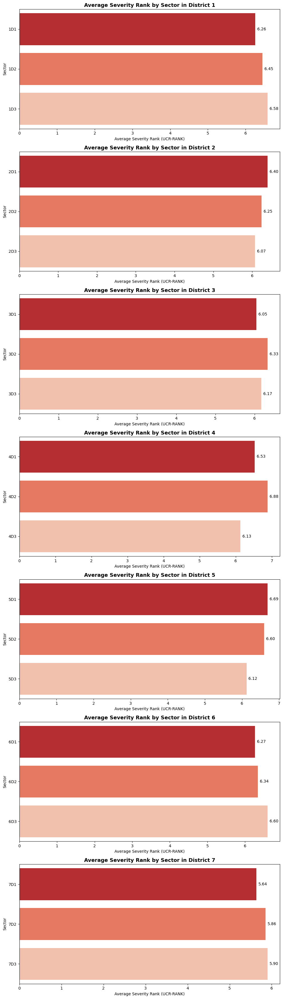

In [85]:
# Aggregate average severity rank by District and Sector
severity_by_district_sector = (
    cleaned_df.groupby(["DISTRICT", "SECTOR"])["UCR-RANK"].mean().reset_index()
)

# Get unique districts
unique_districts = severity_by_district_sector["DISTRICT"].unique()

# Create subplots for each district
fig, axes = plt.subplots(
    nrows=len(unique_districts), ncols=1, figsize=(10, 5 * len(unique_districts))
)

for i, district in enumerate(unique_districts):
    ax = axes[i] if len(unique_districts) > 1 else axes  # Handle single subplot case
    district_data = severity_by_district_sector[
        severity_by_district_sector["DISTRICT"] == district
    ]

    sns.barplot(data=district_data, x="UCR-RANK", y="SECTOR", ax=ax, palette="Reds_r")

    ax.set_title(
        f"Average Severity Rank by Sector in District {district}",
        fontsize=13,
        fontweight="bold",
    )
    ax.set_xlabel("Average Severity Rank (UCR-RANK)")
    ax.set_ylabel("Sector")

    # Annotate bars with values
    for p in ax.patches:
        ax.annotate(
            f"{p.get_width():.2f}",
            (p.get_width(), p.get_y() + p.get_height() / 2),
            ha="left",
            va="center",
            fontsize=10,
            color="black",
            xytext=(5, 0),
            textcoords="offset points",
        )

plt.tight_layout()
plt.show()

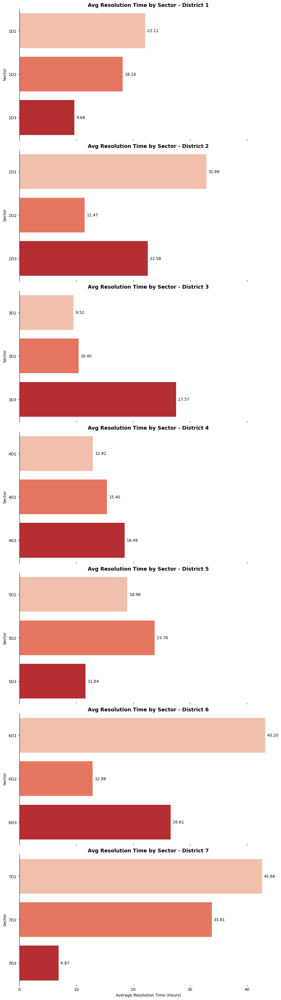

In [86]:
# Group by District and Sector, then compute the average resolution time
sector_resolution = (
    cleaned_df.groupby(["DISTRICT", "SECTOR"])["Resolution_Time"].mean().reset_index()
)

# Set up the figure with multiple subplots (one per district)
districts = sector_resolution["DISTRICT"].unique()
fig, axes = plt.subplots(
    nrows=len(districts), figsize=(10, 5 * len(districts)), sharex=True
)

for ax, district in zip(axes, districts):
    district_data = sector_resolution[sector_resolution["DISTRICT"] == district]
    sns.barplot(
        data=district_data,
        x="Resolution_Time",
        y="SECTOR",
        palette="Reds",
        ax=ax,
    )
    ax.set_title(
        f"Avg Resolution Time by Sector - District {district}",
        fontsize=13,
        fontweight="bold",
    )
    ax.spines[["top", "right", "bottom"]].set_visible(False)
    ax.set_xlabel("Average Resolution Time (Hours)")
    ax.set_ylabel("Sector")
    for p in ax.patches:
        ax.annotate(
            f"{p.get_width():.2f}",
            (p.get_width(), p.get_y() + p.get_height() / 2),
            ha="left",
            va="center",
            fontsize=10,
            color="black",
            xytext=(5, 0),
            textcoords="offset points",
        )


plt.tight_layout()
plt.show()

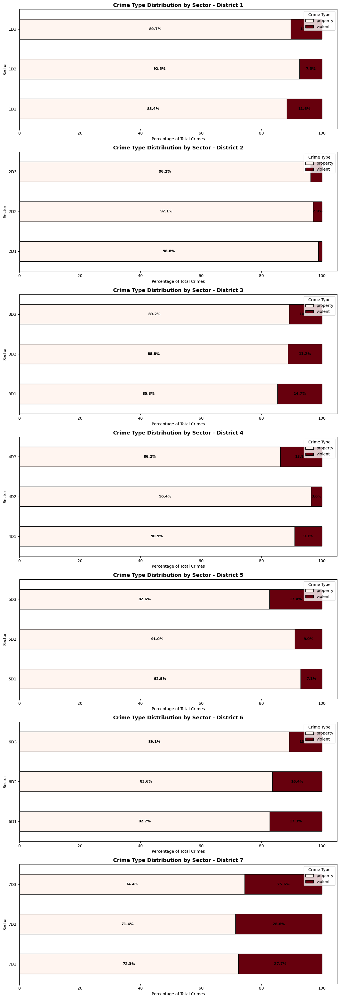

In [87]:
# Group by District, Sector, and Offense Group to count crimes
sector_crime = (
    cleaned_df.groupby(["DISTRICT", "SECTOR", "OFFENSEGROUP"])
    .size()
    .reset_index(name="Crime_Count")
)

# Normalize crime count within each sector to get percentages
sector_crime["Crime_Percent"] = sector_crime.groupby(["DISTRICT", "SECTOR"])[
    "Crime_Count"
].transform(lambda x: x / x.sum() * 100)

# Set up the figure with multiple subplots (one per district)
districts = sector_crime["DISTRICT"].unique()
fig, axes = plt.subplots(nrows=len(districts), figsize=(12, 5 * len(districts)))

for ax, district in zip(axes, districts):
    district_data = sector_crime[sector_crime["DISTRICT"] == district]

    # Create a pivot table for stacking crime types
    pivot_table = district_data.pivot(
        index="SECTOR", columns="OFFENSEGROUP", values="Crime_Percent"
    ).fillna(0)

    bars = pivot_table.plot(
        kind="barh", stacked=True, colormap="Reds", ax=ax, edgecolor="black"
    )

    ax.set_title(
        f"Crime Type Distribution by Sector - District {district}",
        fontsize=13,
        fontweight="bold",
    )
    ax.set_xlabel("Percentage of Total Crimes")
    ax.set_ylabel("Sector")
    ax.legend(title="Crime Type", loc="upper right")

    # Add labels above the bars
    for container in bars.containers:
        for bar in container:
            if bar.get_width() > 2:  # Show labels only for significant values
                ax.text(
                    bar.get_x() + bar.get_width() / 2,
                    bar.get_y() + bar.get_height() / 2,
                    f"{bar.get_width():.1f}%",
                    ha="center",
                    va="center",
                    fontsize=9,
                    color="black",
                    fontweight="bold",
                )

plt.tight_layout()
plt.show()

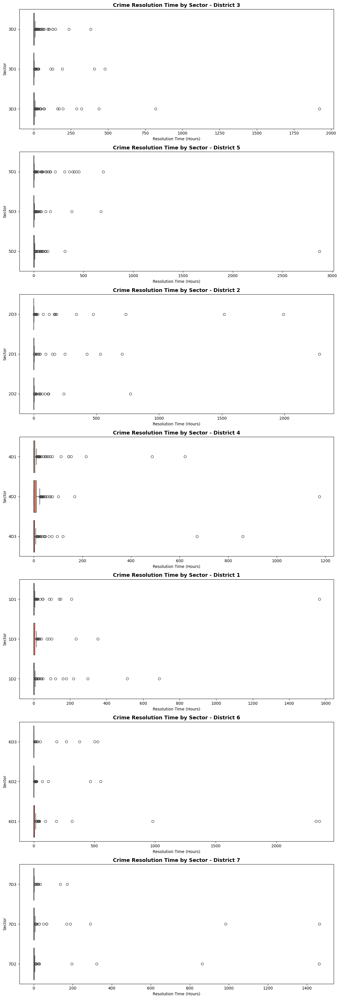

In [88]:
# Filter out missing resolution times
resolution_df = cleaned_df.dropna(subset=["Resolution_Time"])

# Set up the figure with multiple subplots (one per district)
districts = resolution_df["DISTRICT"].unique()
fig, axes = plt.subplots(
    nrows=len(districts), figsize=(12, 5 * len(districts)),
)

for ax, district in zip(axes, districts):
    district_data = resolution_df[resolution_df["DISTRICT"] == district]

    sns.boxplot(
        data=district_data,
        x="Resolution_Time",
        y="SECTOR",
        ax=ax,
        palette="Reds",
        linewidth=1.2,
    )

    ax.set_title(
        f"Crime Resolution Time by Sector - District {district}",
        fontsize=13,
        fontweight="bold",
    )
    ax.set_xlabel("Resolution Time (Hours)")
    ax.set_ylabel("Sector")

plt.tight_layout()
plt.show()

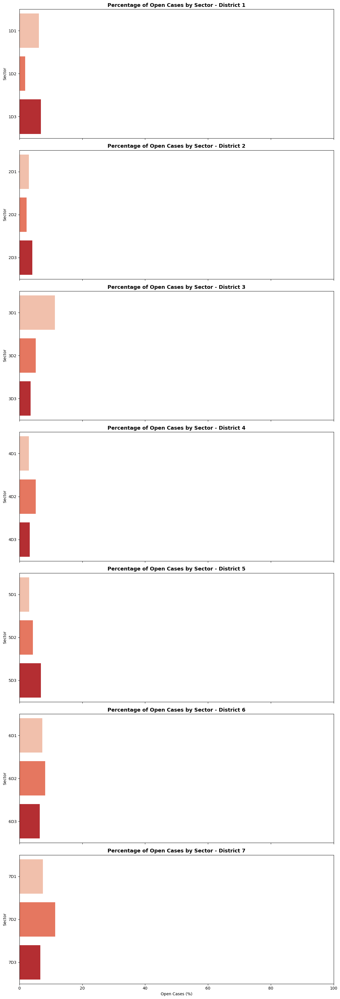

In [89]:
# Group by District and Sector, then calculate open case percentage
open_cases_df = cleaned_df.groupby(["DISTRICT", "SECTOR"]).agg(
    Total_Crimes=("Ongoing_Crime_Flag", "count"),
    Open_Cases=("Ongoing_Crime_Flag", "sum"),
)
open_cases_df["Open_Case_Percentage"] = (
    open_cases_df["Open_Cases"] / open_cases_df["Total_Crimes"]
) * 100
open_cases_df = open_cases_df.reset_index()

# Plot
fig, axes = plt.subplots(
    nrows=len(open_cases_df["DISTRICT"].unique()),
    figsize=(12, 5 * len(open_cases_df["DISTRICT"].unique())),
    sharex=True,
)

districts = open_cases_df["DISTRICT"].unique()
for ax, district in zip(axes, districts):
    district_data = open_cases_df[open_cases_df["DISTRICT"] == district]

    sns.barplot(
        data=district_data, y="SECTOR", x="Open_Case_Percentage", ax=ax, palette="Reds"
    )

    ax.set_title(
        f"Percentage of Open Cases by Sector - District {district}",
        fontsize=13,
        fontweight="bold",
    )
    ax.set_xlabel("Open Cases (%)")
    ax.set_ylabel("Sector")
    ax.set_xlim(0, 100)  # Ensure scale is between 0-100%

plt.tight_layout()
plt.show()

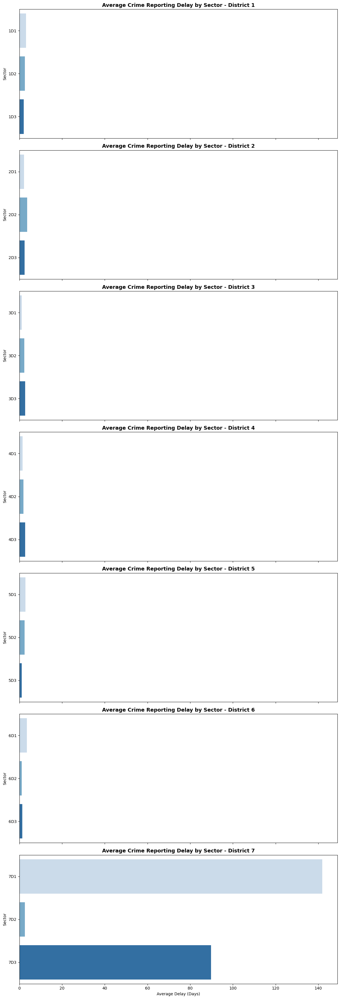

In [90]:
# Group by District and Sector, then calculate average report delay
report_delay_df = (
    cleaned_df.groupby(["DISTRICT", "SECTOR"])
    .agg(Average_Report_Delay=("Report_Delay_Days", "mean"))
    .reset_index()
)

# Plot
fig, axes = plt.subplots(
    nrows=len(report_delay_df["DISTRICT"].unique()),
    figsize=(12, 5 * len(report_delay_df["DISTRICT"].unique())),
    sharex=True,
)

districts = report_delay_df["DISTRICT"].unique()
for ax, district in zip(axes, districts):
    district_data = report_delay_df[report_delay_df["DISTRICT"] == district]

    sns.barplot(
        data=district_data, y="SECTOR", x="Average_Report_Delay", ax=ax, palette="Blues"
    )

    ax.set_title(
        f"Average Crime Reporting Delay by Sector - District {district}",
        fontsize=13,
        fontweight="bold",
    )
    ax.set_xlabel("Average Delay (Days)")
    ax.set_ylabel("Sector")

plt.tight_layout()
plt.show()

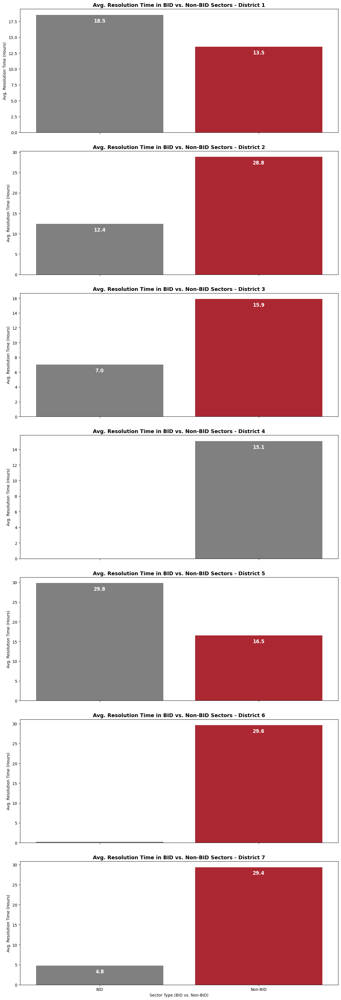

In [91]:
# Group by District and BID_Status, then calculate average resolution time
bid_resolution_time_df = (
    cleaned_df.groupby(["DISTRICT", "BID_Status"])
    .agg(Average_Resolution_Time=("Resolution_Time", "mean"))
    .reset_index()
)

# Plot
fig, axes = plt.subplots(
    nrows=len(bid_resolution_time_df["DISTRICT"].unique()),
    figsize=(12, 5 * len(bid_resolution_time_df["DISTRICT"].unique())),
    sharex=True,
)

districts = bid_resolution_time_df["DISTRICT"].unique()
for ax, district in zip(axes, districts):
    district_data = bid_resolution_time_df[
        bid_resolution_time_df["DISTRICT"] == district
    ]

    sns.barplot(
        data=district_data,
        x="BID_Status",
        y="Average_Resolution_Time",
        ax=ax,
        palette=["gray", "#c1121f"],
    )

    ax.set_title(
        f"Avg. Resolution Time in BID vs. Non-BID Sectors - District {district}",
        fontsize=13,
        fontweight="bold",
    )
    ax.set_ylabel("Avg. Resolution Time (Hours)")
    ax.set_xlabel("Sector Type (BID vs. Non-BID)")
    for p in ax.patches:
        ax.annotate(
            f"{p.get_height():.1f}",
            (p.get_x() + p.get_width() / 2.0, p.get_height()),
            ha="center",
            va="center",
            xytext=(0, -15),
            textcoords="offset points",
            fontsize=12,
            color="white",
            fontweight="bold",
    )

plt.tight_layout()
plt.show()

In [92]:
D7_data = cleaned_df[cleaned_df["DISTRICT"] == 7]

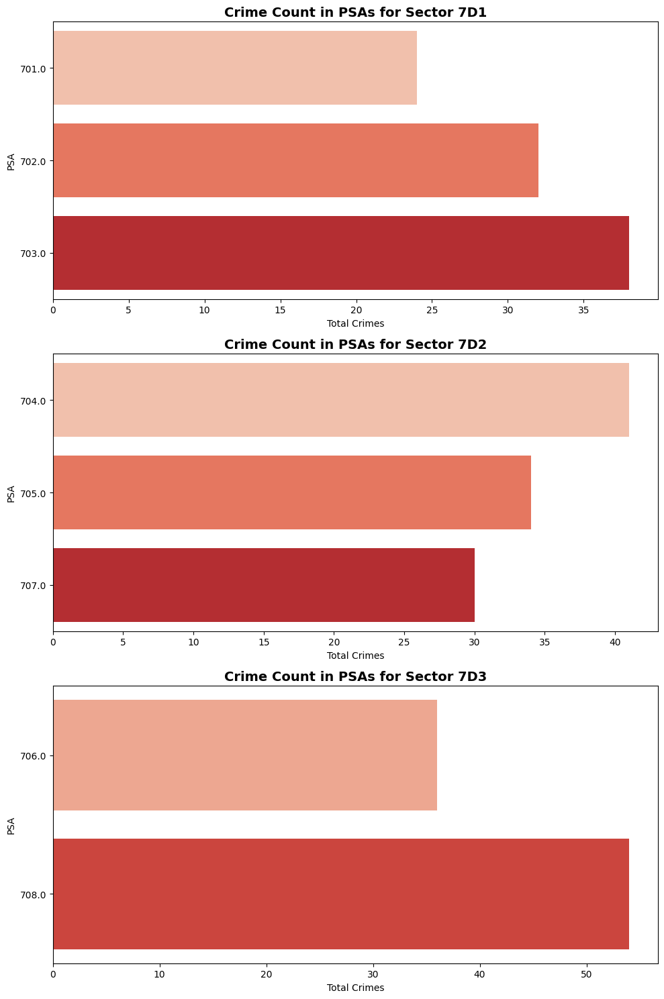

In [93]:
# Group data by Sector and PSA to get crime count
crime_by_sector_psa = (
    D7_data.groupby(["SECTOR", "PSA"]).size().reset_index(name="Crime_Count")
)

# Set up the figure with multiple subplots (one for each Sector)
sectors = crime_by_sector_psa["SECTOR"].unique()
fig, axes = plt.subplots(nrows=len(sectors), figsize=(10, 5 * len(sectors)))

# Plot each sector separately
for ax, sector in zip(axes, sectors):
    sector_data = crime_by_sector_psa[crime_by_sector_psa["SECTOR"] == sector]
    sns.barplot(data=sector_data, x="Crime_Count", y="PSA", palette="Reds", ax=ax)
    ax.set_title(
        f"Crime Count in PSAs for Sector {sector}", fontsize=14, fontweight="bold"
    )
    ax.set_xlabel("Total Crimes")
    ax.set_ylabel("PSA")

plt.tight_layout()
plt.show()

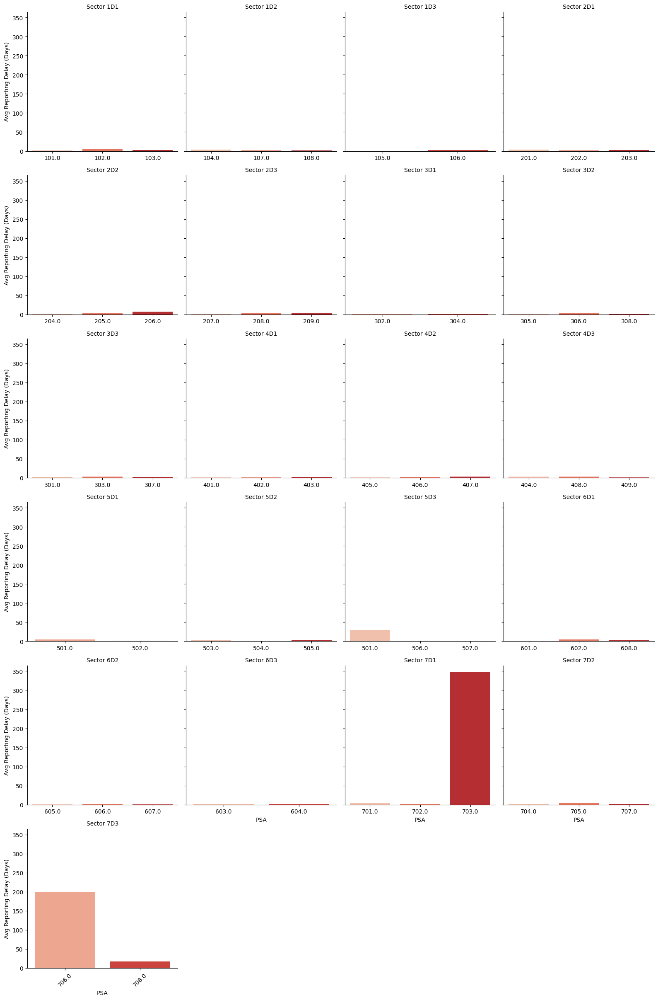

In [94]:
# Grouping by Sector and PSA to calculate the average reporting delay
reporting_delay = (
    cleaned_df.groupby(["SECTOR", "PSA"])["Report_Delay_Days"].mean().reset_index()
)

# Setting up the plot
g = sns.FacetGrid(
    reporting_delay, col="SECTOR", col_wrap=4, sharex=False, sharey=True, height=4
)
g.map_dataframe(sns.barplot, x="PSA", y="Report_Delay_Days", palette="Reds")

# Adjusting plot aesthetics
g.set_axis_labels("PSA", "Avg Reporting Delay (Days)")
g.set_titles(col_template="Sector {col_name}")
plt.xticks(rotation=45)
plt.show()

In [95]:
import folium
from folium.plugins import MarkerCluster
import geopandas as gpd

# Load geojson files
pca_path = "../map/police-service-areas-psa.geojson"
district_path = "../map/police-districts-mpd.geojson"

pca_map = gpd.read_file(pca_path)
district_map = gpd.read_file(district_path)

# Ensure PSA column is numeric for merging
cleaned_df["PSA"] = cleaned_df["PSA"].astype(float).astype(int)

# Group crime data
crime_by_pca = cleaned_df.groupby("PSA").size().reset_index(name="Crime_Count")
crime_by_district = (
    cleaned_df.groupby("DISTRICT").size().reset_index(name="Crime_Count")
)

# Merge crime data with maps
district_data = district_map.merge(
    crime_by_district, left_on="DISTRICT", right_on="DISTRICT"
)
pca_data = pca_map.merge(crime_by_pca, left_on="PSA", right_on="PSA")

# Calculate centroid for positioning map
centroid = pca_data.geometry.centroid
m = folium.Map(location=[centroid.y.mean(), centroid.x.mean()], zoom_start=12)

# ----- DISTRICT LEVEL CHOROPLETH -----
folium.Choropleth(
    geo_data=district_path,
    data=crime_by_district,
    columns=["DISTRICT", "Crime_Count"],
    key_on="feature.properties.DISTRICT",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Crime Rate per District",
).add_to(m)

# ----- PSA LEVEL CHOROPLETH (Added directly to `m`) -----
folium.Choropleth(
    geo_data=pca_path,
    data=crime_by_pca,
    columns=["PSA", "Crime_Count"],
    key_on="feature.properties.PSA",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Crime Rate per PSA",
).add_to(m)

# ----- PSA MARKER CLUSTER -----
psa_layer = folium.FeatureGroup(name="PSA Markers").add_to(m)
marker_cluster = MarkerCluster(name="PSA-Level Details").add_to(psa_layer)
for _, row in pca_data.iterrows():
    folium.Marker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],
        icon=folium.DivIcon(
            html=f'<div style="font-size:5pt; color:black; font-weight:bold;">{row["PSA"]}</div>'
        ),
    ).add_to(marker_cluster)

# ----- DISTRICT LEVEL LABELS -----
for _, row in district_data.iterrows():
    folium.Marker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],
        icon=folium.DivIcon(
            html=f'<div style="font-size:10pt; color:black; font-weight:bold;">{row["DISTRICT"]}</div>'
        ),
    ).add_to(m)

# Add Layer Control
folium.LayerControl(collapsed=False).add_to(m)

m

### Ward Analysis

In [96]:
# Group by district to calculate key metrics
district_summary = (
    cleaned_df.groupby("WARD")
    .agg(
        Most_Reported_Crime=("OFFENSE", lambda x: x.mode()[0]),
        Hottest_Hour=("Start_Hour", lambda x: x.value_counts().idxmax()),
        Avg_Resolution_Time=("Resolution_Time", "mean"),
        Open_Case_Percentage=(
            "Ongoing_Crime_Flag",
            lambda x: (x.sum() / x.count()) * 100,
        ),
        Avg_Reporting_Delay=("Report_Delay_Days", "mean"),
    )
    .reset_index()
)

# Style the table with a white-to-red gradient
cmap = sns.light_palette("#c1121f", as_cmap=True)

styled_table = (
    district_summary.style.background_gradient(
        cmap,
        subset=["Avg_Resolution_Time", "Open_Case_Percentage", "Avg_Reporting_Delay"],
    )
    .format(
        {
            "Avg_Resolution_Time": "{:.2f} Hours",
            "Open_Case_Percentage": "{:.2f}%",
            "Avg_Reporting_Delay": "{:.2f} Days",
        }
    )
    .set_caption("District-Level Crime Insights")
)

styled_table

,WARD,Most_Reported_Crime,Hottest_Hour,Avg_Resolution_Time,Open_Case_Percentage,Avg_Reporting_Delay
0,1.0,theft/other,12,16.83 Hours,7.31%,2.09 Days
1,2.0,theft/other,15,18.10 Hours,4.34%,2.76 Days
2,3.0,theft/other,12,26.34 Hours,2.57%,2.07 Days
3,4.0,theft/other,13,14.47 Hours,3.31%,2.05 Days
4,5.0,theft f/auto,21,15.57 Hours,4.31%,2.00 Days
5,6.0,theft/other,18,18.78 Hours,5.07%,2.78 Days
6,7.0,theft/other,18,30.80 Hours,6.86%,2.29 Days
7,8.0,theft/other,17,23.00 Hours,8.20%,57.75 Days


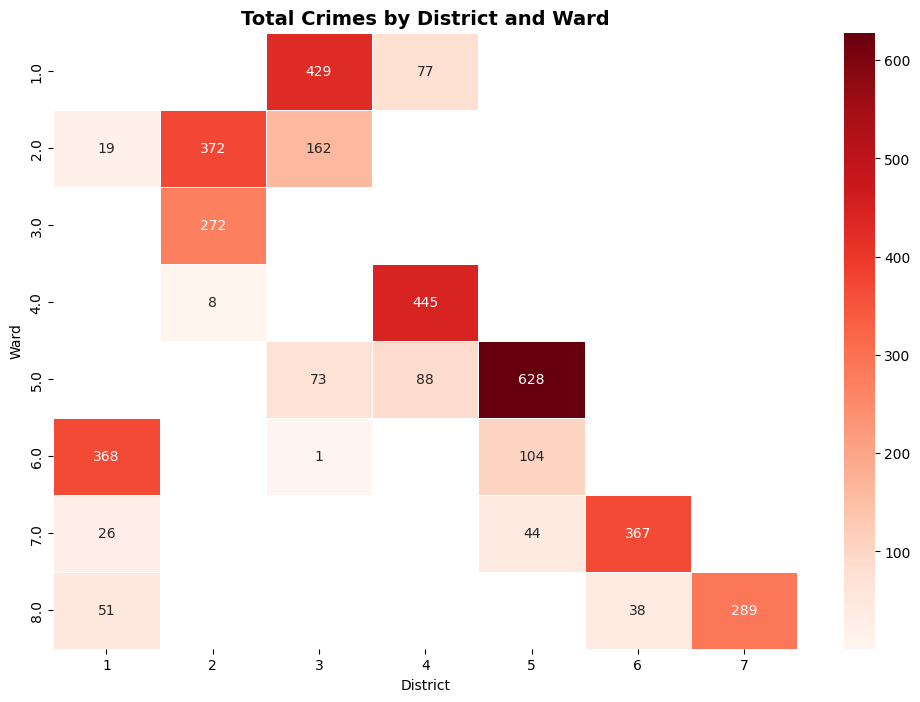

In [97]:
# Aggregate crime count
crime_by_district_ward = (
    cleaned_df.groupby(["DISTRICT", "WARD"]).size().reset_index(name="Crime_Count")
)

# Pivot the data for heatmap
crime_pivot = crime_by_district_ward.pivot(
    index="WARD", columns="DISTRICT", values="Crime_Count"
)

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(crime_pivot, cmap="Reds", annot=True, fmt=".0f", linewidths=0.5)

plt.title("Total Crimes by District and Ward", fontsize=14, fontweight="bold")
plt.xlabel("District")
plt.ylabel("Ward")
plt.show()

### NEIGHBORHOOD CLUSTER

### Advisory Neighborhood Commission

In [98]:
# Filter data to include only records with BID areas
bid_anc_data = cleaned_df.dropna(subset=["BID"])

# Group by ANC and BID to calculate key metrics
anc_bid_summary = (
    bid_anc_data.groupby(["BID", "ANC"])
    .agg(
        District=("DISTRICT", "first"),  # Assuming each tract belongs to one district
        PSA=("PSA", "first"),  # Assuming each tract belongs to one PSA
        Total_Crimes=("OFFENSE", "count"),
        Most_Reported_Crime=(
            "OFFENSE",
            lambda x: x.mode()[0] if not x.mode().empty else "Unknown",
        ),
        Hottest_Hour=("Start_Hour", lambda x: x.value_counts().idxmax()),
        Avg_Resolution_Time=("Resolution_Time", "mean"),
        Open_Case_Percentage=(
            "Ongoing_Crime_Flag",
            lambda x: (x.sum() / x.count()) * 100,
        ),
        Avg_Reporting_Delay=("Report_Delay_Days", "mean"),
    )
    .reset_index()
)

# Apply styling
cmap = sns.light_palette("#c1121f", as_cmap=True)

styled_table = (
    anc_bid_summary.style.background_gradient(
        cmap,
        subset=[
            "Total_Crimes",
            "Avg_Resolution_Time",
            "Open_Case_Percentage",
            "Avg_Reporting_Delay",
        ],
    )
    .format(
        {
            "Total_Crimes": "{:,.0f}",
            "Avg_Resolution_Time": "{:.2f} Hours",
            "Open_Case_Percentage": "{:.2f}%",
            "Avg_Reporting_Delay": "{:.2f} Days",
        }
    )
    .set_caption("Crime Summary: ANC by BID")
)

styled_table

,BID,ANC,District,PSA,Total_Crimes,Most_Reported_Crime,Hottest_Hour,Avg_Resolution_Time,Open_Case_Percentage,Avg_Reporting_Delay
0,adams morgan,1C,3,303,26,theft/other,20,10.55 Hours,3.85%,1.92 Days
1,anacostia,8A,7,703,13,theft/other,19,4.69 Hours,7.69%,6.38 Days
2,anacostia,8C,7,703,1,sex abuse,0,1.00 Hours,0.00%,1.00 Days
3,capitol hill,6B,1,106,41,theft/other,16,19.57 Hours,2.44%,3.15 Days
4,capitol hill,6C,1,102,11,theft f/auto,19,14.02 Hours,9.09%,0.91 Days
5,capitol riverfront,6D,1,105,12,motor vehicle theft,18,41.96 Hours,8.33%,0.33 Days
6,capitol riverfront,8F,1,106,78,motor vehicle theft,19,8.30 Hours,6.41%,1.79 Days
7,downtown,2C,2,207,178,theft/other,10,15.68 Hours,5.06%,1.76 Days
8,downtown,2G,1,101,6,burglary,0,3.61 Hours,16.67%,0.17 Days
9,downtown,6E,1,102,7,theft/other,18,1.75 Hours,0.00%,4.57 Days


In [99]:
# Filter data to include only records where BID is missing (Non-BID areas)
non_bid_anc_data = cleaned_df[cleaned_df["BID"].isna()]

# Group by ANC to calculate key metrics
anc_non_bid_summary = (
    non_bid_anc_data.groupby("ANC")
    .agg(
        District=("DISTRICT", "first"),  # Assuming each tract belongs to one district
        PSA=("PSA", "first"),
        Total_Crimes=("OFFENSE", "count"),
        Most_Reported_Crime=(
            "OFFENSE",
            lambda x: x.mode()[0] if not x.mode().empty else "Unknown",
        ),
        Hottest_Hour=("Start_Hour", lambda x: x.value_counts().idxmax()),
        Avg_Resolution_Time=("Resolution_Time", "mean"),
        Open_Case_Percentage=(
            "Ongoing_Crime_Flag",
            lambda x: (x.sum() / x.count()) * 100,
        ),
        Avg_Reporting_Delay=("Report_Delay_Days", "mean"),
    )
    .reset_index()
)

# Apply styling
cmap = sns.light_palette("#c1121f", as_cmap=True)

styled_table = (
    anc_non_bid_summary.style.background_gradient(
        cmap,
        subset=[
            "Total_Crimes",
            "Avg_Resolution_Time",
            "Open_Case_Percentage",
            "Avg_Reporting_Delay",
        ],
    )
    .format(
        {
            "Total_Crimes": "{:,.0f}",
            "Avg_Resolution_Time": "{:.2f} Hours",
            "Open_Case_Percentage": "{:.2f}%",
            "Avg_Reporting_Delay": "{:.2f} Days",
        }
    )
    .set_caption("Crime Summary: ANC in Non-BID Areas")
)

styled_table

,ANC,District,PSA,Total_Crimes,Most_Reported_Crime,Hottest_Hour,Avg_Resolution_Time,Open_Case_Percentage,Avg_Reporting_Delay
0,1A,3,302,166,theft/other,14,20.02 Hours,9.04%,1.62 Days
1,1B,3,305,150,theft/other,18,9.46 Hours,4.67%,2.62 Days
2,1C,3,303,30,theft/other,12,83.28 Hours,3.33%,5.17 Days
3,1D,3,302,44,theft/other,15,7.71 Hours,11.36%,2.07 Days
4,1E,3,306,78,theft f/auto,18,7.56 Hours,10.26%,1.17 Days
5,2A,2,207,43,theft/other,9,6.04 Hours,0.00%,2.37 Days
6,2B,3,301,53,theft/other,21,19.04 Hours,0.00%,2.49 Days
7,2C,1,103,3,theft f/auto,20,7.95 Hours,0.00%,0.00 Days
8,2D,2,208,4,theft/other,17,539.39 Hours,0.00%,27.00 Days
9,2E,2,206,23,theft/other,13,3.87 Hours,0.00%,17.74 Days


### CENSUS_TRACT 

In [100]:
# Aggregate crime count per Census Tract
crime_by_tract = (
    cleaned_df.groupby(["CENSUS_TRACT", "BID_Status"])
    .size()
    .reset_index(name="Crime_Count")
)

# Normalize by total crimes per tract
crime_by_tract["Crime_Percentage"] = crime_by_tract.groupby("CENSUS_TRACT")[
    "Crime_Count"
].transform(lambda x: x / x.sum() * 100)

# Compute average resolution time per Census Tract
resolution_by_tract = (
    cleaned_df.groupby(["CENSUS_TRACT", "BID_Status"])["Resolution_Time"]
    .mean()
    .reset_index()
)

In [101]:
# Group by Census Tract to calculate key metrics
census_summary = (
    cleaned_df.groupby("CENSUS_TRACT")
    .agg(
        District=("DISTRICT", "first"),  # Assuming each tract belongs to one district
        PSA=("PSA", "first"),  # Assuming each tract belongs to one PSA
        Total_Crimes=("OFFENSE", "count"),
        Most_Reported_Crime=("OFFENSE", lambda x: x.mode()[0]),
        Hottest_Hour=("Start_Hour", lambda x: x.value_counts().idxmax()),
        Avg_Resolution_Time=("Resolution_Time", "mean"),
        Open_Case_Percentage=(
            "Ongoing_Crime_Flag",
            lambda x: (x.sum() / x.count()) * 100,
        ),
        Avg_Reporting_Delay=("Report_Delay_Days", "mean"),
    )
    .reset_index()
)

# Select the top 10 census tracts by crime count
top_10_census_tracts = census_summary.nlargest(10, "Total_Crimes")
top_10_census_tracts.index = range(1, 11)

# Style the table with a white-to-red gradient
cmap = sns.light_palette("#c1121f", as_cmap=True)

styled_table = (
    top_10_census_tracts.style.background_gradient(
        cmap,
        subset=[
            "Total_Crimes",
            "Avg_Resolution_Time",
            "Open_Case_Percentage",
            "Avg_Reporting_Delay",
        ],
    )
    .format(
        {
            "Avg_Resolution_Time": "{:.2f} Hours",
            "Open_Case_Percentage": "{:.2f}%",
            "Avg_Reporting_Delay": "{:.2f} Days",
        }
    )
    .set_caption("Top 10 Census Tracts with Highest Crime Rate")
)

styled_table

,CENSUS_TRACT,District,PSA,Total_Crimes,Most_Reported_Crime,Hottest_Hour,Avg_Resolution_Time,Open_Case_Percentage,Avg_Reporting_Delay
1,8803.0,5,501,143,theft f/auto,15,12.43 Hours,2.10%,3.83 Days
2,10100.0,2,207,97,theft/other,0,18.20 Hours,3.09%,1.32 Days
3,2802.0,3,302,96,theft/other,14,1.99 Hours,8.33%,0.54 Days
4,5802.0,1,101,74,theft/other,15,14.18 Hours,6.76%,2.50 Days
5,9102.0,5,505,71,theft/other,18,10.34 Hours,4.23%,2.69 Days
6,11100.0,5,503,63,theft f/auto,0,65.53 Hours,3.17%,3.71 Days
7,9204.0,5,502,61,theft f/auto,20,2.61 Hours,1.64%,0.54 Days
8,3500.0,3,305,58,theft/other,11,2.78 Hours,10.34%,0.31 Days
9,10602.0,1,105,55,motor vehicle theft,18,31.23 Hours,1.82%,4.58 Days
10,10700.0,2,207,49,theft/other,13,3.40 Hours,8.16%,0.73 Days


In [102]:
# Get the bottom 10 Census Tracts by crime rate
bottom_10_census_tracts = census_summary.sort_values(
    "Total_Crimes", ascending=True
).head(10)

# Reset index to start from 1
bottom_10_census_tracts.index = range(1, 11)

# Style the table with a white-to-red gradient
cmap = sns.light_palette("#c1121f", as_cmap=True)

styled_table = (
    bottom_10_census_tracts.style.background_gradient(
        cmap,
        subset=["Avg_Resolution_Time", "Open_Case_Percentage", "Avg_Reporting_Delay"],
    )
    .format(
        {
            "Avg_Resolution_Time": "{:.2f} Hours",
            "Open_Case_Percentage": "{:.2f}%",
            "Avg_Reporting_Delay": "{:.2f} Days",
        }
    )
    .set_caption("Bottom 10 Census Tracts by Crime Rate")
)

styled_table

,CENSUS_TRACT,District,PSA,Total_Crimes,Most_Reported_Crime,Hottest_Hour,Avg_Resolution_Time,Open_Case_Percentage,Avg_Reporting_Delay
1,704.0,2,204,1,motor vehicle theft,22,1.25 Hours,0.00%,0.00 Days
2,201.0,2,206,1,theft/other,20,2.00 Hours,0.00%,0.00 Days
3,502.0,2,204,1,motor vehicle theft,18,92.83 Hours,0.00%,3.00 Days
4,11002.0,3,308,1,motor vehicle theft,9,0.78 Hours,0.00%,0.00 Days
5,11001.0,1,105,1,motor vehicle theft,22,14.25 Hours,0.00%,0.00 Days
6,2704.0,3,302,2,motor vehicle theft,1,1.53 Hours,0.00%,0.00 Days
7,5602.0,2,207,2,theft f/auto,12,87.01 Hours,0.00%,3.50 Days
8,9906.0,6,604,2,motor vehicle theft,21,0.20 Hours,0.00%,0.00 Days
9,8200.0,1,108,2,motor vehicle theft,15,80.13 Hours,0.00%,3.00 Days
10,980000.0,1,103,3,theft f/auto,20,8.20 Hours,0.00%,0.00 Days


### BLOCK_GROUP 

### BLOCK 